# Self-Study OpenCV library (Part 1)
- Contents are from book "Ayush Vaishya - Mastering OpenCV with Python" 
- Start at 2024.3.26
- This notebook includes some notes from learning chapters with example codes. (Review purpose only)
- Includes Chapter 1 to Chapter 6. (Total 12 Chapters)

## Chap1. Introduction to Computer Vision

- “Computer vision is a subset of artificial intelligence with visual information at its heart. The field focuses on enabling computers to process, analyze, and interpret image data and generate meaningful insights from it.”
  
- “Open-Source Computer Vision Library (OpenCV) is the focal library we are going to be using for image processing applications. OpenCV is originally written in C++ language, although it is compatible with Python using Python bindings. OpenCV, along with Python, provides a strong combination for creating powerful computer vision applications and is frequently used for research and deployment.”

- Supporting libraries: Numpy, Matplotlib, Scipy, Scikit-learn, Scikit-Image, OpevCV 4.7, Tensorflow, Keras, Dlib...
- Install python & supporting libraries.
- Environment setting.

In [1]:
#check installation
import cv2
import numpy as np
import scipy
import matplotlib
#import mahotas
import sklearn
import skimage
print(cv2.__version__)
print(np.__version__)
print(scipy.__version__)
print(matplotlib.__version__)
#print(mahotas.__version__)
print(sklearn.__version__)
print(skimage.__version__)

4.9.0
1.26.4
1.12.0
3.8.3
1.4.1.post1
0.22.0


## Chap2. Getting start with Images

- Introduction to images and pixels
  
- Reading, displaying, and writing images
- Imread/Imshow/Imwrite/Waitkey

- Manipulating images with pixels
- Accessing individual pixels
- Accessing a region of interest (ROI)

- Drawing in OpenCV

- Line/Rectangle/Circle/Text

### cv2.imread

In [3]:
#read an image
path = 'BlackCat.jpg'
img = cv2.imread(path)

In [4]:
print(img.shape)

(1400, 2141, 3)


In [5]:
#resize the image
#img = cv2.resize(img, (300,300))

### cv2.imshow

- cv2.imshow("Cat", img)
- cv2.waitKey(0)
- 会出现WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.

- 这个警告信息是由于在macOS系统上运行OpenCV时，某些底层的Cocoa API没有使用安全编码的方式。
通常这个警告不会影响图像显示的功能，但是它表明在应用程序中可能存在潜在的安全问题。

- 当你在Jupyter Lab或其他类似的环境中使用OpenCV的imshow函数时，你可能会遇到问题，因为这些环境可能不支持创建新窗口来显示图像。
如果你正在使用Jupyter Lab，并且想要在notebook中显示图像，你可以使用matplotlib来代替OpenCV的imshow函数。

In [ ]:
cv2.imshow("Cat", img)
cv2.waitKey(0) #会在新窗口弹出图像，但notebook会一直卡着
cv2.destroyAllWindows()

2024-03-27 11:15:58.513 Python[58459:6428408] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


### cv2.imwrite

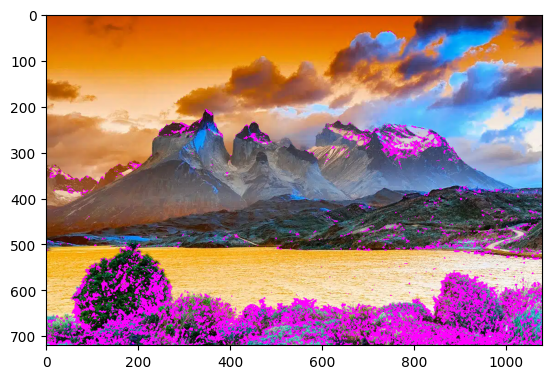

In [422]:
plt.imshow(new_img)
plt.show()

In [424]:
cv2.imwrite("mountain_with_kp.jpg", new_img) #保存到当前文件夹

True

### plt替代

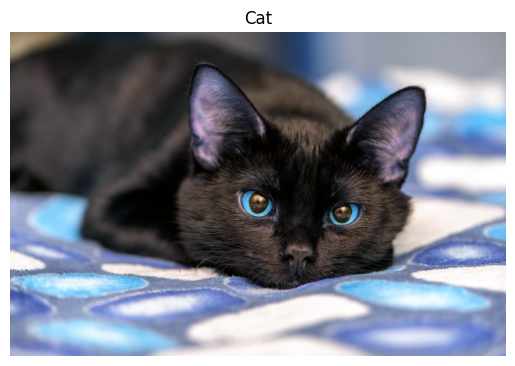

In [5]:
from matplotlib import pyplot as plt
#img = cv2.cvtCOLOR(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title("Cat")
plt.axis('off')
plt.show()

### RBG image/Change pixel value

In [6]:
# Get the pixel value at x=75, y=25
pixel_value = img[25, 75]
#Print this value
print(pixel_value)



[159 138 110]


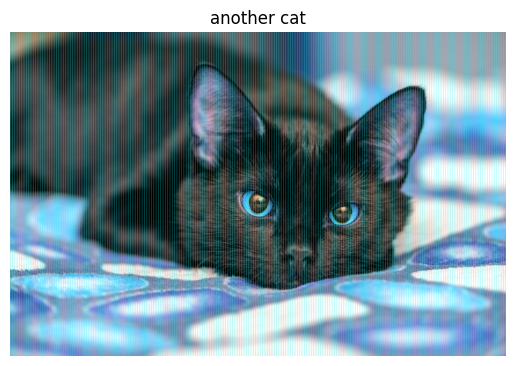

In [11]:
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        if j % 10 == 0:
            img[i,j] = [0,255,255] #RBG image has 3 dimensions; greyscale image has 1 dimension
plt.imshow(img)
plt.axis('off')
plt.title('another cat')
plt.show()

### ROI (Region of Interest)

In [19]:
#coordinates x, y
#define a rectangle ROI with w, h (width, height)
x=300
y=100
w=100
h=100
roi = img[y:y+h, x:x+w]
print(roi.shape)

(100, 100, 3)


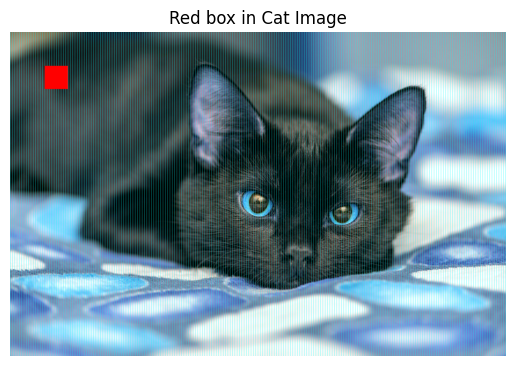

In [21]:
#assign a color to a different ROI
img[150:250, 150:250] = (255,0,0)
plt.imshow(img)
plt.title("Red box in Cat Image")
plt.axis('off')
plt.show()

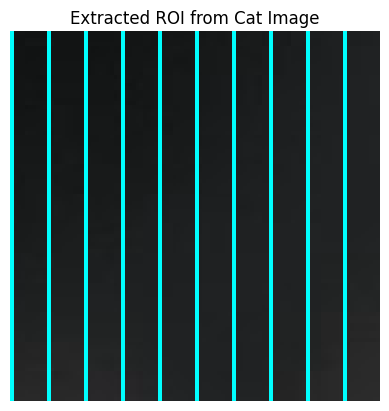

In [22]:
plt.imshow(roi)
plt.title("Extracted ROI from Cat Image")
plt.axis('off')
plt.show()

### Drawing in OpenCV

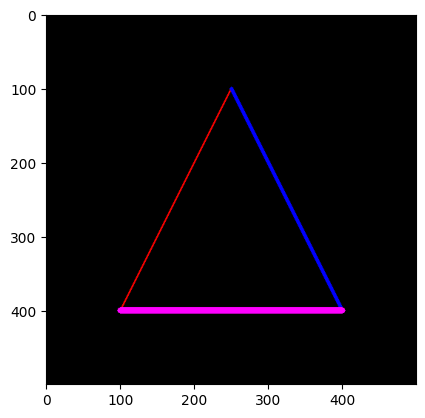

In [32]:
#draw a triangle by lines
canvas = np.zeros((500,500,3), dtype=np.uint8)
p1 = (250,100) #point (x,y)
p2 = (100,400)
p3 = (400,400)
#draw a line using cv2.line()
cv2.line(canvas, p1, p2, (255,0,0), thickness=2, lineType=cv2.LINE_8) #give 2 pts
cv2.line(canvas, p3, p1, (0,0,255), thickness=3)
cv2.line(canvas, p3, p2, (255,0,255), thickness=8)
#show the canvas
plt.imshow(canvas)
plt.show()

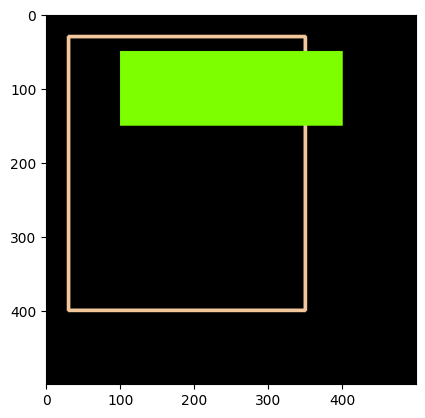

In [41]:
#draw 2 rectangles
canvas = np.zeros((500,500,3), dtype=np.uint8)
cv2.rectangle(canvas, (30,30), (350,400), (242,199,155), thickness=3) #give 2 pts: top left pt + bottom right pt
cv2.rectangle(canvas, (100,50),(400,150),(125,255,0),thickness=-1)
plt.imshow(canvas)
plt.show()

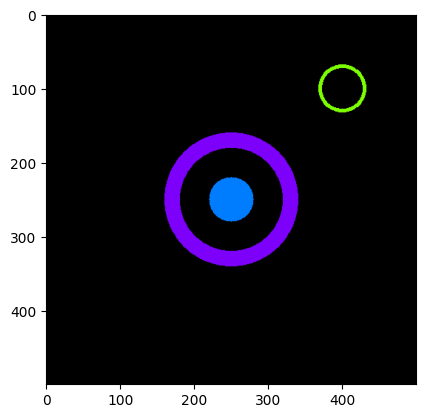

In [50]:
#draw circles
canvas = np.zeros((500,500,3), dtype=np.uint8)
center1=(250,250)
center2=(400,100)
radius1=80
radius2=30
color1=(125,0,250)
color2=(125,255,0)
color3=(0,125,255)
cv2.circle(canvas, center1, radius1, color1, thickness=20)
cv2.circle(canvas, center2, radius2, color2, thickness=3)
cv2.circle(canvas, center1, radius2, color3, thickness=-1) #thickness=-1 ->填充
#show
plt.imshow(canvas)
plt.show()

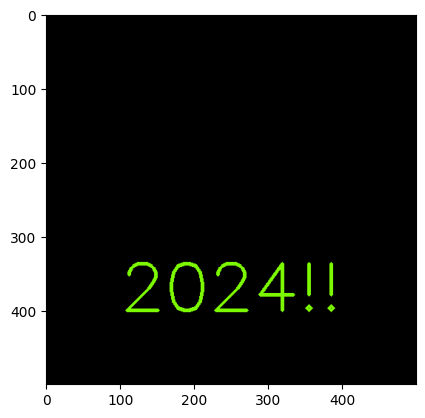

In [57]:
#Add text to image
canvas = np.zeros((500,500,3), dtype=np.uint8)
text = "2024!!"
bottom_left=(100,400)
size=3
color=(125,250,0)
cv2.putText(canvas, text, bottom_left, fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=size, color=color, thickness=3)
#show
plt.imshow(canvas)
plt.show()

## Chap3. Image Processing Fundamentals

- Geometric transformations on images: Image translation, Rotation, Scaling, Flipping, Shearing, Cropping


- Arithmetic operations (+ - * /)

- Bitwise operations (AND, OR, XOR, NOT)

- Chanels and color spaces

### Image Translation

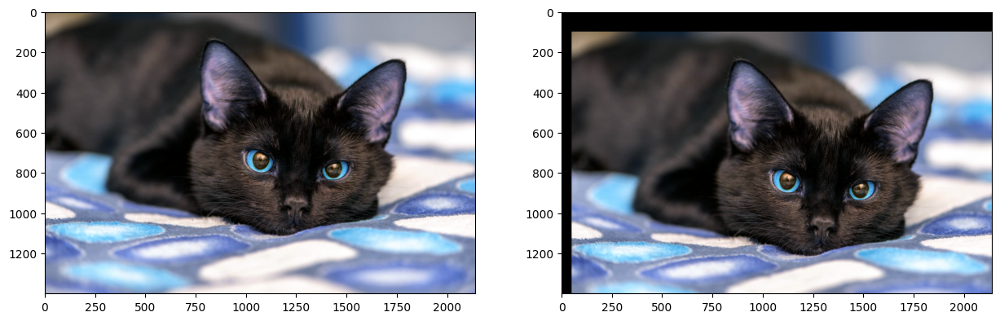

In [63]:
#defina a translation matrix
img = cv2.imread(path)
tx = 50 #x-direction
ty = 100 #y-direction
trans_mat = np.float32([[1,0,tx],[0,1,ty]])

# Apply the translation to the image
rows, cols, _ = img.shape
translated_img = cv2.warpAffine(img, trans_mat, (cols, rows))

#show
fig, axs = plt.subplots(1, 2, figsize=(15,10))
axs[0].imshow(img)
axs[1].imshow(translated_img)
plt.show()

### Rotation

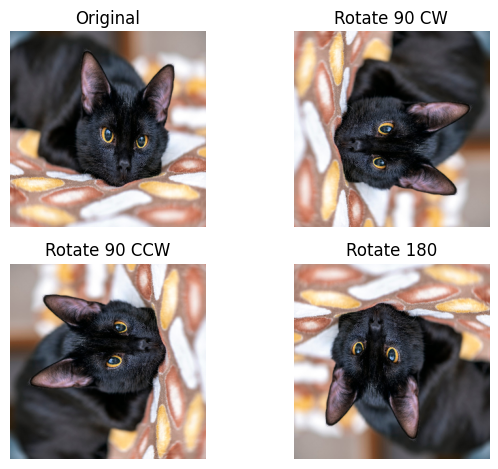

In [81]:
img = cv2.imread(path)
img = cv2.resize(img, (300,300))
#rotate clockwise by 90 degrees and 180 degrees
img_r_90 = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
img_r_90c = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
img_r_180 = cv2.rotate(img, cv2.ROTATE_180)

# 创建子图
fig, axs = plt.subplots(2, 2)

# 显示原图
axs[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('Original')
axs[0, 0].axis('off')

# 显示顺时针旋转90度后的图像
axs[0, 1].imshow(cv2.cvtColor(img_r_90, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('Rotate 90 CW')
axs[0, 1].axis('off')

# 显示逆时针旋转90度后的图像
axs[1, 0].imshow(cv2.cvtColor(img_r_90c, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title('Rotate 90 CCW')
axs[1, 0].axis('off')

# 显示旋转180度后的图像
axs[1, 1].imshow(cv2.cvtColor(img_r_180, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title('Rotate 180')
axs[1, 1].axis('off')

# 自动调整布局并显示
plt.tight_layout()
plt.show()        

### Custom rotation

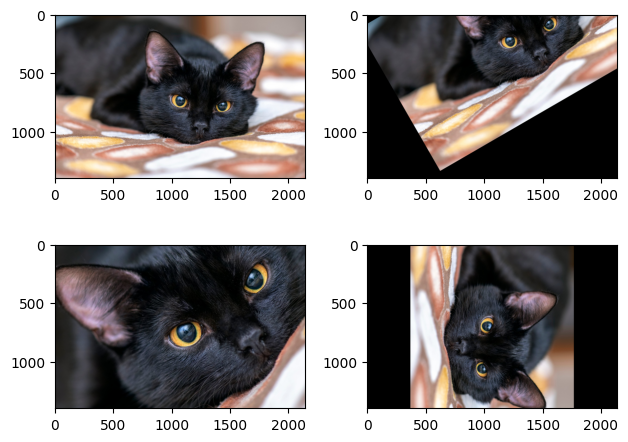

In [84]:
img = cv2.imread(path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

rows, cols = img.shape[:2]

#get rotation matrices
center1=(200,200)
degree1=30
scale1=1
m1 = cv2.getRotationMatrix2D(center1, degree1, scale1)

center2=(cols/2, rows/2)
degree2=45
scale2=2
m2 = cv2.getRotationMatrix2D(center2, degree2, scale2)

m3 = cv2.getRotationMatrix2D(center2, -90, scale1)

#perform rotations
r1 = cv2.warpAffine(img, m1, (cols, rows))
r2 = cv2.warpAffine(img, m2, (cols, rows))
r3 = cv2.warpAffine(img, m3, (cols, rows))

#show
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,1].imshow(r1)
axes[1,0].imshow(r2)
axes[1,1].imshow(r3)

plt.tight_layout()
plt.show()

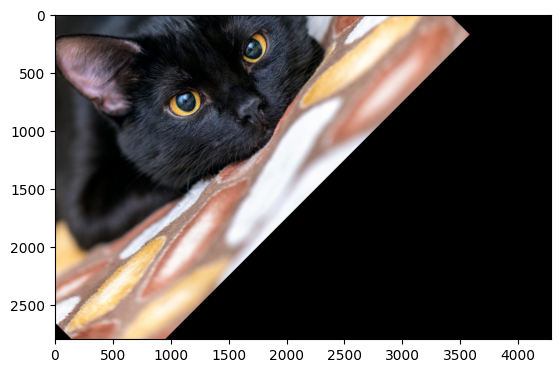

In [85]:
#r2 scaled by 2, adjust it to new size
scale2 = 2
new_cols=int(cols*scale2)
new_rows=int(rows*scale2)

#create output image with new size
rotate2 = cv2.warpAffine(img, m2, (new_cols,new_rows))
#show
plt.imshow(rotate2)
plt.show()

### Scaling

cv2.resize(src, dst, dsize, fx=0, fy=0, interpolation=cv2.INTER_LINEAR)


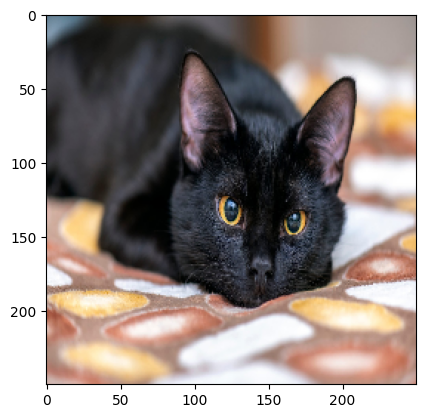

In [93]:
#resize the image to half size

s1 = cv2.resize(img,(250,250), fx=0.5, fy=0.5)
plt.imshow(s1)
plt.show()

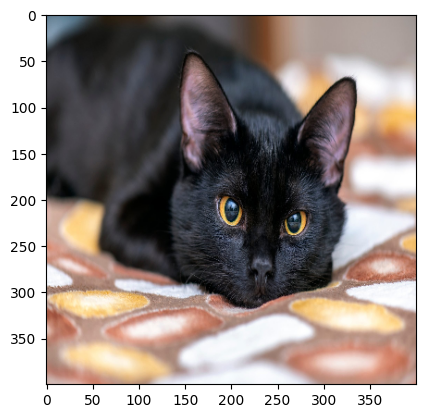

In [94]:
#Image scaling can also be implemented using the cv2.warpAffine function:

# Define the new size
new_size = (400, 400)
# Compute the scaling factors for x and y axis
sx = new_size[0]/img.shape[1]
sy = new_size[1]/img.shape[0]

# Define the transformation matrix
M = np.float32([[sx, 0, 0], [0, sy, 0]])

# Apply the affine transformation
resized_img = cv2.warpAffine(img, M, new_size)

plt.imshow(resized_img)
plt.show()

### Flipping
cv2.flip(src, dst, flipCode=1)

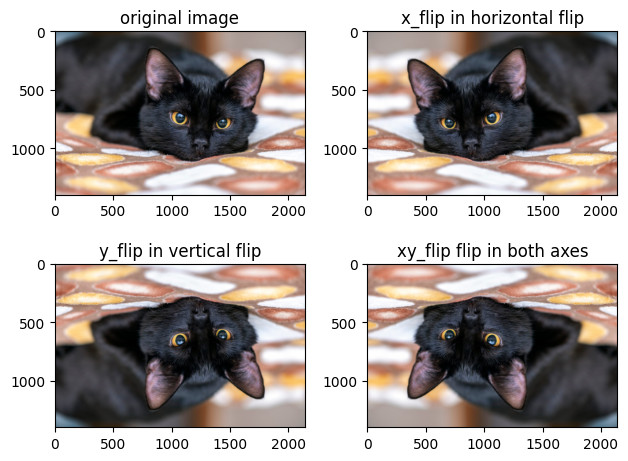

In [99]:
#horizontal flip, vertical flip, flip on both axes 
x_flip = cv2.flip(img,1)
y_flip = cv2.flip(img,0)
xy_flip = cv2.flip(img, -1)

#show
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,0].set_title("original image")

axes[0,1].imshow(x_flip)
axes[0,1].set_title("x_flip in horizontal flip")

axes[1,0].imshow(y_flip)
axes[1,0].set_title("y_flip in vertical flip")

axes[1,1].imshow(xy_flip)
axes[1,1].set_title("xy_flip flip in both axes")

plt.tight_layout()
plt.show()

### Shearing
- Image Shearing is a linear transformation that distorts an image along one of its axes.
- use cv2.warpAffine()

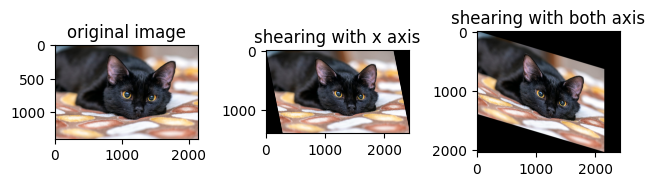

In [100]:
#shearing parameters
shear_factor_x = 0.2
shear_factor_y = 0.3

#obtain shearing matrices
M_x = np.array([[1, shear_factor_x,0],[0,1,0]])
M_y = np.array([[1,0,0],[shear_factor_y,1,0]])

#apply shearing transformation
rows, cols = img.shape[:2]
shear_img_x = cv2.warpAffine(img, M_x, (cols+int(rows*shear_factor_x), rows))
shear_img_xy = cv2.warpAffine(img, M_y, (cols+int(rows*shear_factor_x), rows+int(cols*shear_factor_y)))

#show
fig, axes = plt.subplots(1,3)
axes[0].imshow(img)
axes[0].set_title("original image")

axes[1].imshow(shear_img_x)
axes[1].set_title("shearing with x axis")

axes[2].imshow(shear_img_xy)
axes[2].set_title("shearing with both axis")

plt.tight_layout()
plt.show()

### Cropping

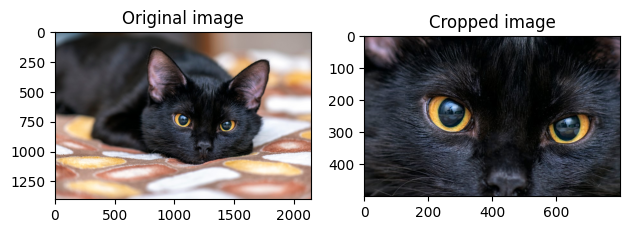

In [104]:
#set ROI coordinates
x1, y1 = 800, 500 #top-left pt
x2, y2 = 1600, 1000 #righ-bottom pt

crop_img = img[y1:y2, x1:x2]

fig, axes = plt.subplots(1,2)
axes[0].imshow(img)
axes[0].set_title("Original image")

axes[1].imshow(crop_img)
axes[1].set_title("Cropped image")

plt.tight_layout()
plt.show()

### Arithmetic Operation
#### Image Addition
  
    - The main advantage of image addition is that it allows us to implement more complex operations such as image blending or masking. 


In [107]:
#initialize 2 sample images (3x3)
img1 = np.array([[10,20,30],
                 [40,50,60],
                 [70,80,90]],
                dtype=np.uint8)

img2 = np.array([[100,200,150],
                 [50,250,100],
                 [150,200,50]],
                dtype=np.uint8)

#Add 2 images
cv2_add = cv2.add(img1, img2)
print("cv2_add result:\n",cv2_add)

numpy_add = img1+img2
print("\n numpy_add result:\n", numpy_add)

cv2_add result:
 [[110 220 180]
 [ 90 255 160]
 [220 255 140]]

 numpy_add result:
 [[110 220 180]
 [ 90  44 160]
 [220  24 140]]


The cv2.add() function is then used to add img1 and img2, and the result is stored in cv2_add. Any pixel value that is greater than 255 is set to 255 (the maximum value that can be stored in a uint8 datatype), while any pixel value less than 0 is set to 0. Thus, the values at indexes [1,1] and [2,1] are set to 255, as they added up to 300 and 280, respectively.

Next, we perform addition using the NumPy operation. In this case, the values are not clipped to 255 but are wrapped around, as discussed earlier. Thus, the values for [1,1] and [2,1] indexes are 44 and 24, respectively.

  
NumPy 数组的加法是按照模算术进行的，如果数据类型为 np.uint8，那么所有的运算都会被限制在 0 到 255 的范围内。如果加法的结果超过了 255，它会回绕至 0。这种行为称为整数溢出.
- 由于 np.uint8 类型的最大值是 255，300 超过了这个范围，因此发生了溢出。
- 为了计算实际的溢出值，你可以使用模 256 的结果：300 % 256 = 44


#### Weighted addition of images (Image Blending)

which means that each image has a different contribution to the final output, and these contributions are not equal, as shared earlier.


We use the cv2.addWeighted() function for this:


cv2.addWeighted(src1, alpha=1.0, src2, beta=0.0, gamma=0.0, dst, dtype)


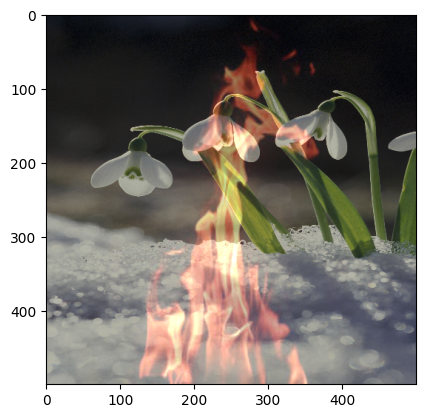

In [114]:
#read 2 images
path1="Flower.jpg"
path2="Fire.jpg"
img1=cv2.imread(path1)
img2=cv2.imread(path2)

#transform images to same size
img1 = cv2.resize(img1, (500,500))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.resize(img2, (500,500))
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

#weighted addition
result = cv2.addWeighted(img1, 0.7, img2, 0.5, 0)

#show
plt.imshow(result)
plt.show()

#### Subtraction

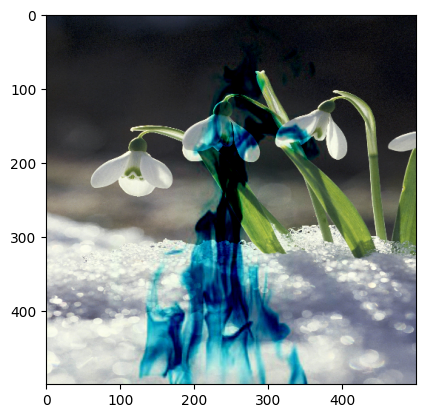

In [121]:
result_subtraction = cv2.subtract(img1, img2, 0)

#show
plt.imshow(result_subtraction)
plt.show()

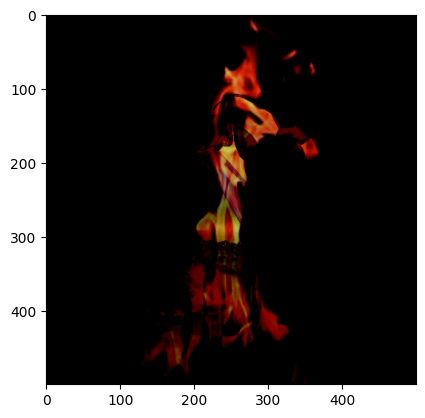

In [125]:
result_subtraction = cv2.subtract(img2, img1, 0)

#show
plt.imshow(result_subtraction)
plt.show()

#### Multiplication and Division

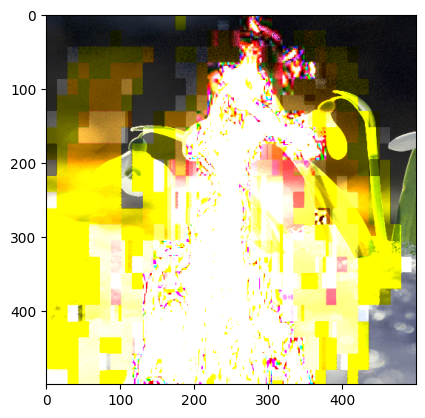

In [128]:
result_multiply = cv2.multiply(img1, img2, 0.8)

#show
plt.imshow(result_multiply)
plt.show()

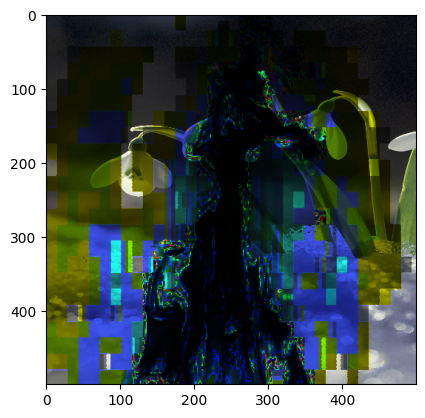

In [129]:
result_divide = cv2.divide(img1, img2, 0.8)

#show
plt.imshow(result_divide)
plt.show()

### Bitwise Operation

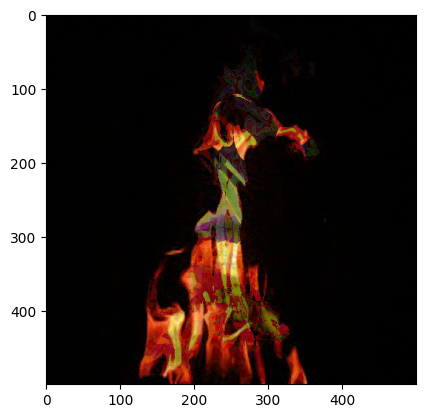

In [131]:
#Bitwise - AND
result_bitwise_and = cv2.bitwise_and(img1, img2, 0)
plt.imshow(result_bitwise_and)
plt.show()

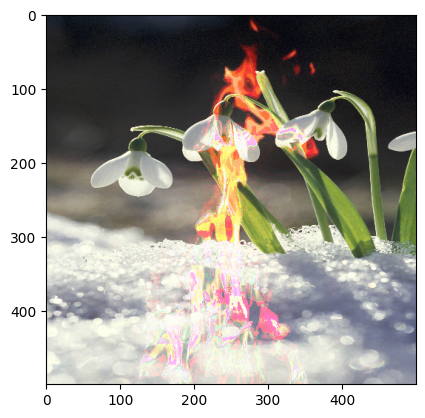

In [132]:
#Bitwise - OR
result_bitwise_or = cv2.bitwise_or(img1, img2, 0)
plt.imshow(result_bitwise_or)
plt.show()

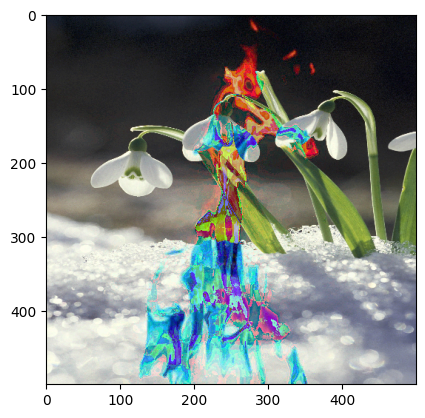

In [133]:
#Bitwise - XOR
result_bitwise_xor = cv2.bitwise_xor(img1, img2, 0)
plt.imshow(result_bitwise_xor)
plt.show()

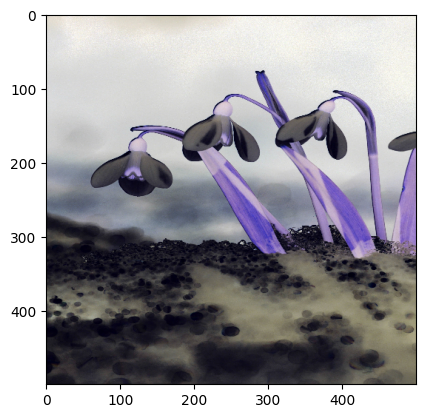

In [135]:
#Bitwise - NOT
result_bitwise_not = cv2.bitwise_not(img1)
plt.imshow(result_bitwise_not)
plt.show()

### Chanels, RGB Color Space

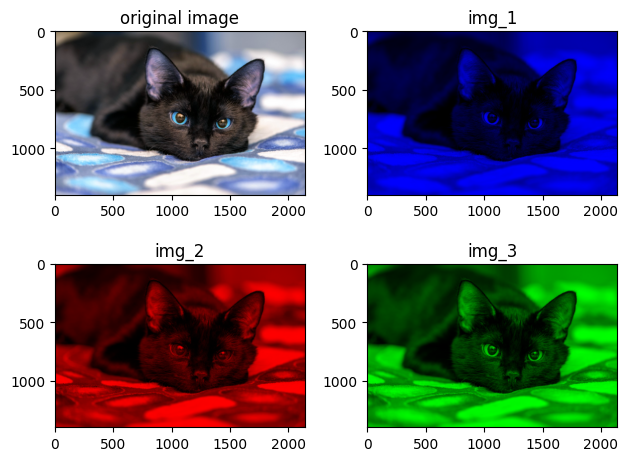

In [141]:
img = cv2.imread(path)

img_1 = img.copy()
img_2 = img.copy()
img_3 = img.copy()

img_1[:,:,0]=0 
img_1[:,:,1]=0 #红色和绿色通道设置为0，保留了蓝色通道
img_2[:,:,2]=0
img_2[:,:,1]=0
img_3[:,:,2]=0
img_3[:,:,0]=0

#show
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,0].set_title("original image")

axes[0,1].imshow(img_1)
axes[0,1].set_title("img_1")

axes[1,0].imshow(img_2)
axes[1,0].set_title("img_2")

axes[1,1].imshow(img_3)
axes[1,1].set_title("img_3")

plt.tight_layout()
plt.show()

#### cv2.cvtColor()

在OpenCV中，彩色图像默认使用BGR（蓝色、绿色、红色）通道顺序。

这意味着：

第一个通道（索引为0）是蓝色（B）
第二个通道（索引为1）是绿色（G）
第三个通道（索引为2）是红色（R）

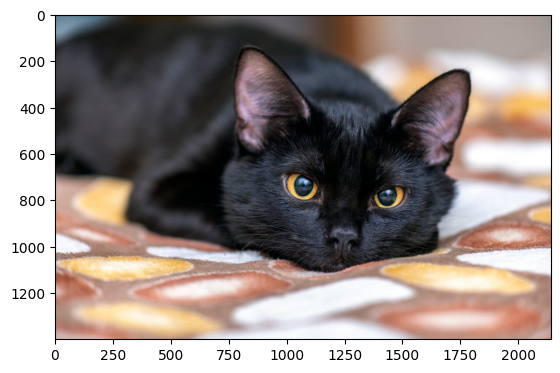

In [145]:
result_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #转换成RGB才看起来和原图一样
plt.imshow(result_RGB)
plt.show()

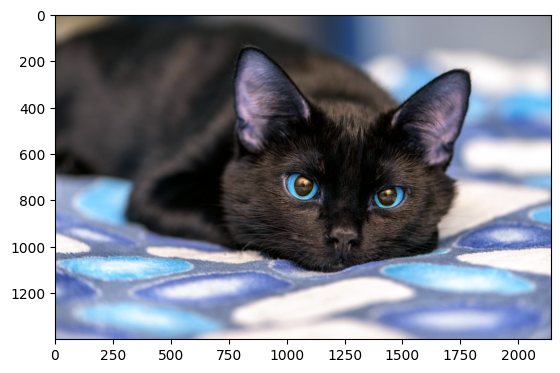

In [146]:
plt.imshow(img) #不转换直接读取的是 OpenCV默认的BGR色彩，与原图片并不一样
plt.show()

#### Hue Saturation Value (HSV) color space
- 色相、饱和度、明度

色相（Hue）：色相是颜色的基本属性，是使颜色区别于其他颜色的特征。在HSV颜色空间中，色相用圆环的角度来表示，范围从0到360度。在OpenCV中，为了将色相值适配到8位整数的范围（0-255），色相的值被缩放到了0-179。这意味着OpenCV中色相的每个单位大约对应于原来角度的两度。


饱和度（Saturation）：饱和度衡量的是颜色的强度或纯度，表示从最灰的状态（0%）到最鲜艳的状态（100%）。在HSV颜色空间中，饱和度通常用百分比来表示，从完全不饱和（灰色）到完全饱和（纯色）。


明度（Value）：明度或价值指的是颜色的亮度或黑度。它不反映任何颜色，只反映灰度级别。在HSV模型中，明度也用百分比表示，从0%（黑色）到100%（白色）。明度决定了颜色的光亮程度。


- 在图像处理中，HSV颜色空间经常用于颜色分割、跟踪和识别等任务，因为在许多情况下它比RGB或BGR颜色空间更容易分离颜色。例如，如果你想在图像中提取所有的绿色区域，你可以简单地设置色相值的阈值范围来匹配绿色的色相，并适当调整饱和度和明度的阈值。

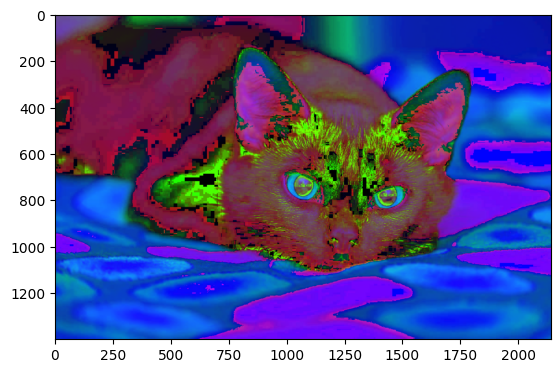

In [144]:
result_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.imshow(result_HSV)
plt.show()

#### Hue Saturation Lightness (HSL) color space

- 亮度（Lightness）：亮度是HSL颜色空间的第三个分量，它代表颜色的明亮程度。与HSV的明度（Value）不同，亮度（Lightness）的定义是颜色从纯黑（0%）到纯白（100%）的中间值。在50%亮度下，颜色将展示其最真实的色彩。


HSL颜色空间在图像处理中的应用与HSV类似，例如在色彩过滤、调整和分析等方面。通过调整HSL空间中的参数，可以在不影响其他颜色属性的情况下独立地更改颜色的特定方面。例如，在进行图像编辑时，如果想保持颜色的鲜艳度，同时调整亮暗程度，可以仅修改亮度（Lightness）分量。

#### Other color space

1. LAB color space

是由国际照明委员会（CIE）定义的，它旨在作为一种与设备无关的颜色空间，可以用来准确表示所有可见颜色。它广泛用于颜色校正和图像处理领域。LAB颜色空间包括三个分量：
    
    - **L***：表示亮度（Luminance），L* 轴的值从0（黑）到100（白），代表了颜色从纯黑到纯白的亮度变化。
    - **a***：表示从绿色到红色的颜色对立维度。a* 轴的负值表示绿色，正值表示红色。
    - **b***：表示从蓝色到黄色的颜色对立维度。b* 轴的负值表示蓝色，正值表示黄色。


Lab色彩空间是一种基于人类视觉感知的非线性色彩空间，能够比其他色彩空间（如RGB或CMYK）更精确地表示颜色。在Lab色彩空间中，颜色之间的距离旨在更接近人类的颜色感知差异，这使它成为色彩校正和色彩管理系统中的理想选择。
由于Lab*提供了一种度量颜色之间视觉差异的方法，所以它常用于图像编辑和分析，如颜色增强、颜色平衡调整和不同设备之间的颜色匹配。

2. YCbCr color space


YCbCr 是一种用于数字图像和视频处理的颜色空间，尤其常见于 JPEG 编码标准。YCbCr 的组成部分解释如下：
- Y：Y 代表颜色的亮度（Luminance）或灰度值。在图像或视频处理中，人眼对亮度的敏感度远大于色度，因此亮度信息在图像数据中占据主要位置。
- Cb 和 Cr：Cb 和 Cr 两个分量代表了蓝色和红色的色度偏移值（Chrominance）。Cb 显示的是蓝色分量与亮度值的差异，而 Cr 显示的是红色分量与亮度值的差异。这两个分量一同决定了图像的色彩信息。


通过将亮度信息（Y）和色度信息（Cb 和 Cr）分开，YCbCr 颜色空间能够更有效地压缩数据，因为它可以在保留亮度信息的同时降低色度信息的分辨率。这是基于人眼对亮度更敏感、对色度较不敏感的生理特性。因此，在图像和视频压缩（如 JPEG 和 MPEG）中，YCbCr 颜色空间得到了广泛的应用。


3. Greyscale

灰度图像仅包含单个通道，这个通道的值用来表示像素的亮度。灰度值范围从0（黑色）到255（白色），中间的值表示不同程度的灰色。


由于人眼对绿色光的敏感度最高，对红色和蓝色光的敏感度较低，所以将RGB颜色空间转换为灰度时，通常采用不同的权重来更好地反映人类的视觉感知。这就是为什么在转换公式中绿色的权重最高，红色次之，蓝色最低。Grayscale = 0.2989 * Red + 0.5870 * Green + 0.1140 * Blue

这种加权方法有助于在转换过程中保持图像的视觉亮度感知一致性。在图像处理中，将彩色图像转换为灰度图像是一个常见的步骤，因为它简化了处理过程，并且对于某些算法（如边缘检测、纹理分析和目标跟踪）来说，灰度图像就足够了。

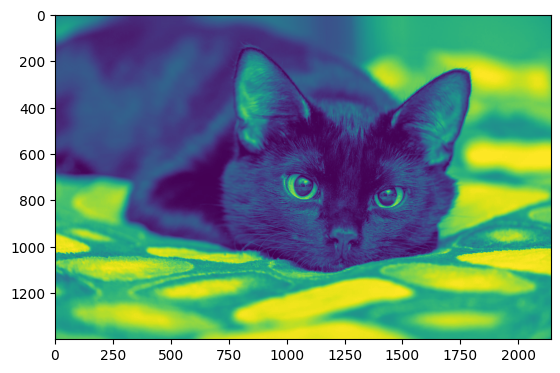

In [143]:
#greyscale
result_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(result_grey)
plt.show()

## Chap4. Image Operations

- Morphological operations on images

    - Erosion
    - Dilation
    - Opening and closing
    - Morphological gradient
    - Tophat and Black hat


- Image smoothing and blurring

    - Average blur
    - Median blur
    - Gaussian blur
    - Bilateral filter


### Morphological operations

#### Erosion

Erosion involves reducing the size of the object by removing pixels near the boundary. 

Erosion works by initializing a structuring element and passing this structuring element over each pixel of the image. The area under the structuring element is considered for the operation:

    - If all the pixels inside the area are greater than zero, then the value is changed to 255.
    - If the pixels within the area are not all greater than zero, they are set to zero.

The process is repeated for all the pixels of the image. Essentially, if any cell in the kernel is black, the center pixel in consideration will turn black as well.

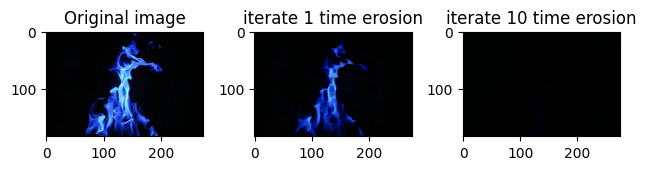

In [148]:
#Erosion can remove noises

img=cv2.imread(path2)
kernel = np.ones((5,5),np.uint8)

#apply erode
img_e1 = cv2.erode(img, kernel, iterations=1)
img_e2 = cv2.erode(img, kernel, iterations=10)

#show
fig, axes = plt.subplots(1,3)
axes[0].imshow(img)
axes[0].set_title("Original image")

axes[1].imshow(img_e1)
axes[1].set_title("iterate 1 time erosion")

axes[2].imshow(img_e2)
axes[2].set_title("iterate 10 time erosion")

plt.tight_layout()
plt.show()

#### Dilation

Dilation involves increasing the size of the object in an image by adding pixels to its boundary. 

By using a larger structuring element, dilation can also be used to fill gaps or holes in the image as it adds pixels to the boundaries. 

We can use dilation to enhance the edges of an object. Dilation can enhance edges with thin lines or gaps, resulting in an object with more clearly defined boundaries. Similar to erosion, dilation is also often used as a precursor to various image processing applications.

    - If any of the pixels inside are greater than 0, then the value is changed to 255.
    - If there are no pixels inside the area of the structuring element, the point is set to 0.

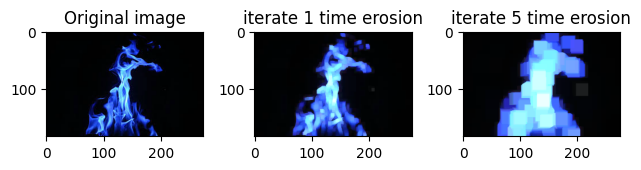

In [152]:
#Dilate image

img=cv2.imread(path2)
kernel = np.ones((5,5),np.uint8)

#apply dilation
img_d1 = cv2.dilate(img, kernel, iterations=1)
img_d2 = cv2.dilate(img, kernel, iterations=5)

#show
fig, axes = plt.subplots(1,3)
axes[0].imshow(img)
axes[0].set_title("Original image")

axes[1].imshow(img_d1)
axes[1].set_title("iterate 1 time erosion")

axes[2].imshow(img_d2)
axes[2].set_title("iterate 5 time erosion")

plt.tight_layout()
plt.show()

#### Opening

- Opening is a morphological operation that is a sequence of erosion and dilation operations. Erosion followed by Dilation is referred to as an opening operation in image processing.

- This is called an opening operation as it “opens” up the main object in the image by removing unwanted objects or noise from the image and then restoring the object to its original size.

##### First erosion, then dilation

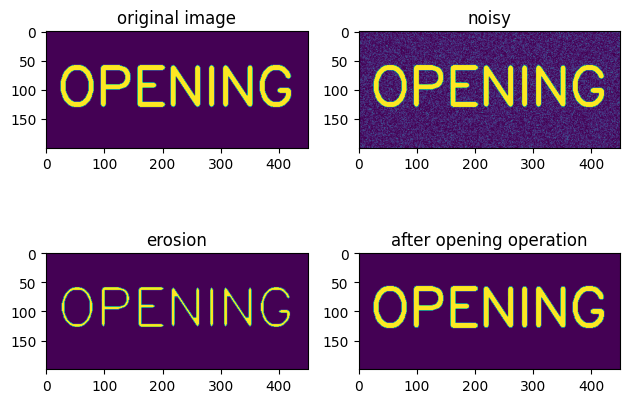

In [168]:
#Generate a canvas
img = np.zeros((200,450),np.uint8)

#Draw text on it 
font = cv2.FONT_HERSHEY_SIMPLEX
img = cv2.putText(img, "OPENING", (20,125), font, 3, (255,255,255),8)

#Add some noise
noise = np.zeros((200,450),np.uint8) #must same size with img
cv2.randn(noise, 0, 50) #以0为中心的随机噪声矩阵，噪声值主要集中在-50到+50的范围内
noisy = cv2.add(img, noise)

#kernel
kernel = np.ones((5,5), np.uint8)

#erosion
erosion = cv2.erode(noisy, kernel, iterations=1)

#dilate
opening = cv2.dilate(erosion, kernel, iterations=1)

#show 4 images
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,0].set_title("original image")

axes[0,1].imshow(noisy)
axes[0,1].set_title("noisy")

axes[1,0].imshow(erosion)
axes[1,0].set_title("erosion")

axes[1,1].imshow(opening)
axes[1,1].set_title("after opening operation")

plt.tight_layout()
plt.show()

##### cv2.morphologyEx() 
- instead of erosion and dilation
- inbuilt opening operation 

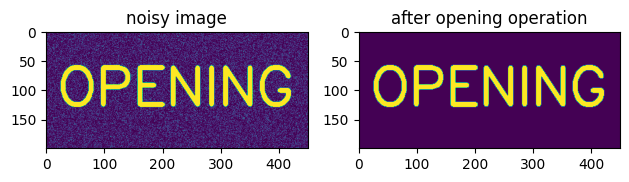

In [165]:
#morphology operation

#Generate an image with black background
img = np.zeros((200,450),np.uint8)

#Draw text on it 
font = cv2.FONT_HERSHEY_SIMPLEX
img = cv2.putText(img, "OPENING", (20,125), font, 3, (255,255,255),8)

#Add some noise
noise = np.zeros((200,450),np.uint8) #must same size with img
cv2.randn(noise, 0, 50) #以0为中心的随机噪声矩阵，噪声值主要集中在-50到+50的范围内
noisy = cv2.add(img, noise)

#kernel
kernel = np.ones((5,5), np.uint8)

#opening operation instead of erosion and dilation 
opening = cv2.morphologyEx(noisy, cv2.MORPH_OPEN, kernel)

#show 2 images
fig, axes = plt.subplots(1,2)

axes[0].imshow(noisy)
axes[0].set_title("noisy image")

axes[1].imshow(opening)
axes[1].set_title("after opening operation")

plt.tight_layout()
plt.show()

#### Closing

##### First dilation, then erosion

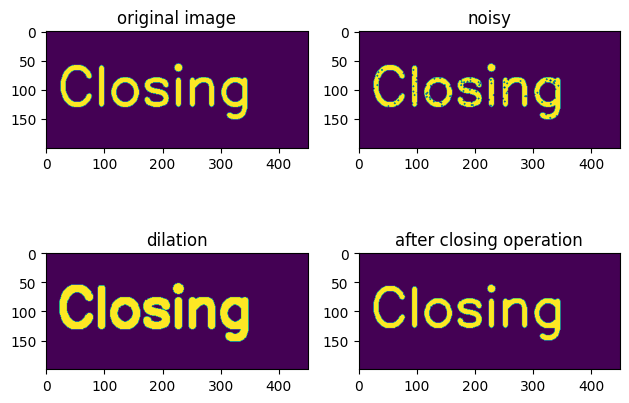

In [167]:
#Generate a canvas
img = np.zeros((200,450),np.uint8)

#Draw text on it 
font = cv2.FONT_HERSHEY_SIMPLEX
img = cv2.putText(img, "Closing", (20,125), font, 3, (255,255,255),8)

noisy_img= img.copy()
#create noise using difference of two images
noise = np.zeros_like(img)
for i in range(1000):
    x, y = np.random.randint(0, img.shape[1]), np.random.randint(0, img.shape[0])
    cv2.circle(noisy_img, (x,y), 1, (0,0,0), -1)

#kernel
kernel = np.ones((5,5), np.uint8)

#Closing operation
dilated_img = cv2.dilate(noisy_img, kernel)
closed_img = cv2.erode(dilated_img, kernel)

#show 4 images
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,0].set_title("original image")

axes[0,1].imshow(noisy_img)
axes[0,1].set_title("noisy")

axes[1,0].imshow(dilated_img)
axes[1,0].set_title("dilation")

axes[1,1].imshow(closed_img)
axes[1,1].set_title("after closing operation")

plt.tight_layout()
plt.show()

#### cv2.morphologyEx() 
- instead of erosion and dilation
- inbuilt opening operation 

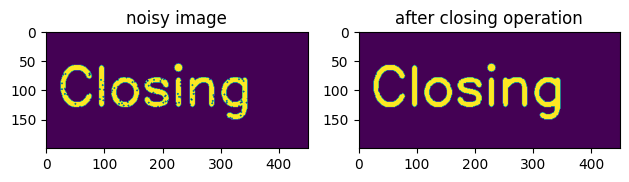

In [169]:
#Generate a canvas
img = np.zeros((200,450),np.uint8)

#Draw text on it 
font = cv2.FONT_HERSHEY_SIMPLEX
img = cv2.putText(img, "Closing", (20,125), font, 3, (255,255,255),8)

noisy_img= img.copy()
#create noise using difference of two images
noise = np.zeros_like(img)
for i in range(1000):
    x, y = np.random.randint(0, img.shape[1]), np.random.randint(0, img.shape[0])
    cv2.circle(noisy_img, (x,y), 1, (0,0,0), -1)

#kernel
kernel = np.ones((5,5), np.uint8)

#closing operation
closed_img = cv2.morphologyEx(noisy_img, cv2.MORPH_CLOSE, kernel)

#show 2 images
fig, axes = plt.subplots(1,2)

axes[0].imshow(noisy_img)
axes[0].set_title("noisy image")

axes[1].imshow(closed_img)
axes[1].set_title("after closing operation")

plt.tight_layout()
plt.show()

#### Morphological Gradient

- The morphological gradient is the difference between dilation and erosion operations on an image.

- The main objective of the morphological gradient is to highlight the boundary of the object in our images.

- Apart from edge detection, morphological gradients can also help us in segmenting images or extracting objects from the image as the edges are much more prominent than before.


The morphological gradient can be expressed as follows:

    Morphological Gradient (G) = Dilation (D) - Erosion (E)


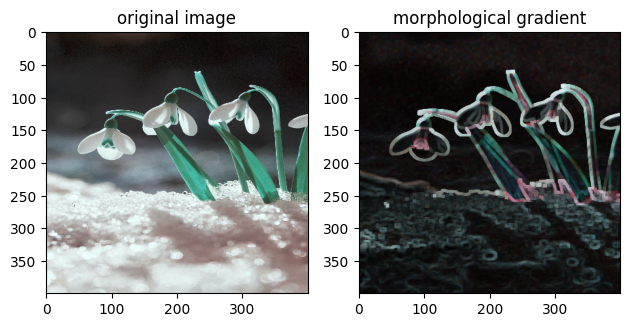

In [172]:
img = cv2.imread(path1)
img = cv2.resize(img, (400,400))

#kernel
kernel = np.ones((5,5), np.uint8)

#morphological gradient operation 
mor_grad = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

#show 2 images
fig, axes = plt.subplots(1,2)

axes[0].imshow(img)
axes[0].set_title("original image")

axes[1].imshow(mor_grad)
axes[1].set_title("morphological gradient")

plt.tight_layout()
plt.show()

#### Top hat

- called as "white hat operation", used to highlight the bright region
- top hat operation is the difference between opening of image and original image

- This allows this operation to be used in various applications where the minute features need to be highlighted. It has various medical applications such as the detection of blood vessels or nuclei in cell images as these regions can be easily enhanced and thus segmented from the original image for further examination. We can also use this method to detect small objects in an image or for applications such as analyzing textures or detecting dents or cracks on a surface.

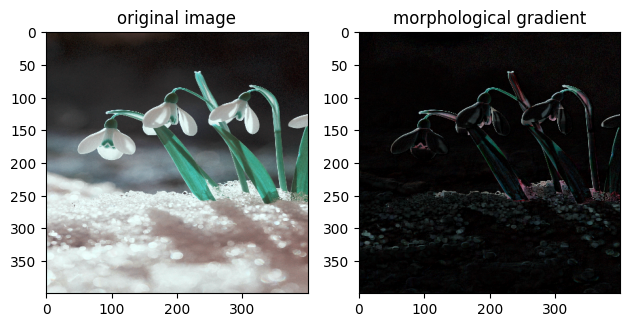

In [175]:
img = cv2.imread(path1)
img = cv2.resize(img, (400,400))

#kernel
kernel = np.ones((8,8), np.uint8)

#morphological gradient operation 
top_hat = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

#show 2 images
fig, axes = plt.subplots(1,2)

axes[0].imshow(img)
axes[0].set_title("original image")

axes[1].imshow(top_hat)
axes[1].set_title("morphological gradient")

plt.tight_layout()


#### Bottom hat

- called as "black hat operation", used to highlight the black region
- bottom hat operation is the difference between closing of image and original image


Black hat operations have a wide array of uses in image processing, as they highlight the edges and boundaries of objects. These capabilities of black hat operations allow them to be used for various tasks such as image segmentation and edge detection. Text written against dark backgrounds or handwritten letters or words can be identified using black hat operations.

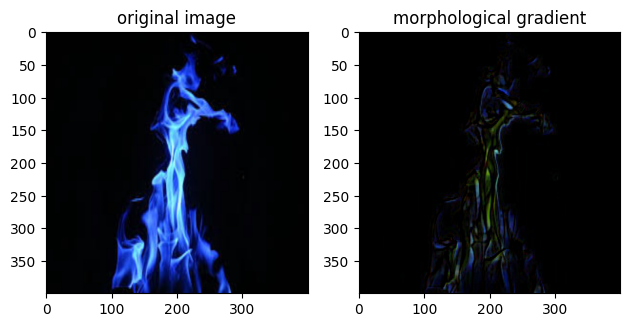

In [178]:
img = cv2.imread(path2)
img = cv2.resize(img, (400,400))

#Define a rectangle structuring element for the top hat operation
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (8,8))

#morphological gradient operation  
bottom_hat = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

#show 2 images
fig, axes = plt.subplots(1,2)

axes[0].imshow(img)
axes[0].set_title("original image")

axes[1].imshow(bottom_hat)
axes[1].set_title("morphological gradient")

plt.tight_layout()


### Smoothing and Blurring

#### Average blurring

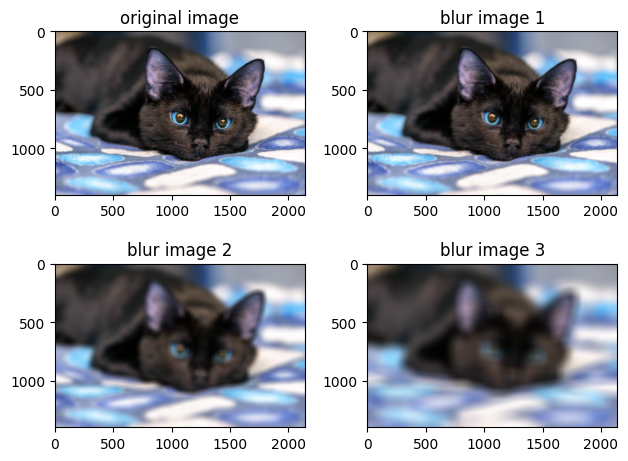

In [184]:
img = cv2.imread(path)

#different kernel size 
blur_1 = cv2.blur(img, (10,10))
blur_2 = cv2.blur(img, (50,50))
blur_3 = cv2.blur(img, (100,100))


#show 4 images
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,0].set_title("original image")

axes[0,1].imshow(blur_1)
axes[0,1].set_title("blur image 1")

axes[1,0].imshow(blur_2)
axes[1,0].set_title("blur image 2")

axes[1,1].imshow(blur_3)
axes[1,1].set_title("blur image 3")

plt.tight_layout()
plt.show()

#### Median Blur

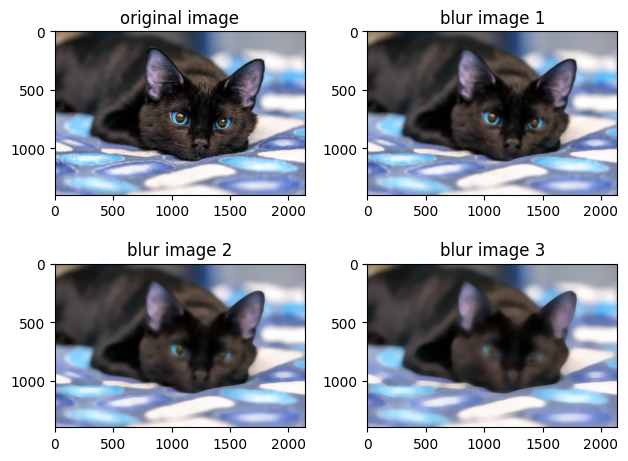

In [190]:
img = cv2.imread(path)

#different kernel size
blur_1 = cv2.medianBlur(img, 25) #para different from average blur
blur_2 = cv2.medianBlur(img, 45)
blur_3 = cv2.medianBlur(img, 65)


#show 4 images
fig, axes = plt.subplots(2,2)

axes[0,0].imshow(img)
axes[0,0].set_title("original image")

axes[0,1].imshow(blur_1)
axes[0,1].set_title("blur image 1")

axes[1,0].imshow(blur_2)
axes[1,0].set_title("blur image 2")

axes[1,1].imshow(blur_3)
axes[1,1].set_title("blur image 3")

plt.tight_layout()
plt.show()

We can notice that the median blur has been able to preserve edges more compared to the average blur.


Median blur is particularly useful in removing salt and pepper noise from the image. (especially for salt and pepper noise)

#### Gaussian Blur

Gaussian blurring is useful to remove various types of noise from the image, but the main effect of Gaussian blurring can be seen in Gaussian noise. 

Gaussian noise is a noise that follows the Gaussian probability distribution. Gaussian images will make our images look grainy.


cv2.gaussianBlur()

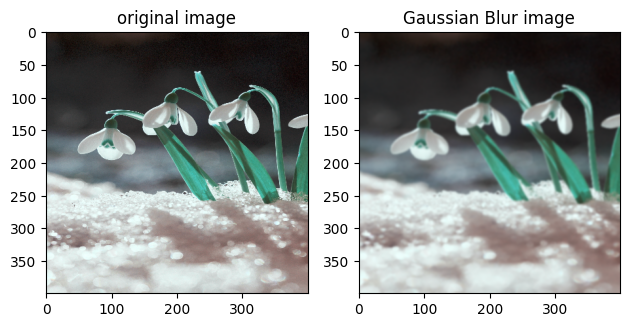

In [192]:
img = cv2.imread(path1)
img = cv2.resize(img, (400,400))

blur_img = cv2.GaussianBlur(img, (7,7), 0)

#show 2 images
fig, axes = plt.subplots(1,2)

axes[0].imshow(img)
axes[0].set_title("original image")

axes[1].imshow(blur_img)
axes[1].set_title("Gaussian Blur image")

plt.tight_layout()


#### Bilateral filter双边滤波

A bilateral filter is a non-linear filter that allows us to blur images while preserving the edges of objects in the image. This makes it a popular choice for a wide range of image processing applications such as denoising and edge detection.

cv2.bilateralFilter(src, d, sigmaColor, sigmaSpace)

- sigmaColor 是颜色空间的标准偏差。这个参数越大，表明该像素邻域内有更多的颜色会被混合到一起，产生较大面积的半相似颜色区域。
- sigmaSpace 是坐标空间中滤波器标准偏差，空间参数越大，意味着离得更远的像素将相互影响，从而使更大的区域内具有相似的颜色。

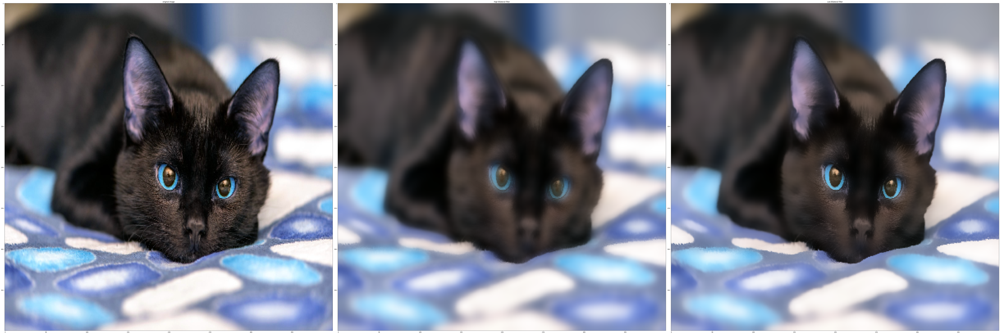

In [198]:
img = cv2.imread(path)
img = cv2.resize(img, (400,400))

filtered_h = cv2.bilateralFilter(img, 15, 250, 250)
filtered_l = cv2.bilateralFilter(img, 15, 100, 100)

#show 2 images
fig, axes = plt.subplots(1,3, figsize=(100,60))

axes[0].imshow(img)
axes[0].set_title("original image")

axes[1].imshow(filtered_h)
axes[1].set_title("High Bilateral Filter")

axes[2].imshow(filtered_l)
axes[2].set_title("Low Bilateral Filter")

plt.tight_layout()


## Chap5. Image Histograms

- Introduction to Histograms
- Matplotlib helper functions
- Histogram for colored images
- Two-dimensional histograms
- Histogram with masks
- Histogram equalization
    - Introduction to histogram equalization
    - Histogram equalization on colored images
    - Adaptive histogram equalization
    - Contrast limited adaptive histogram equalization
- Histograms for feature extraction

### Intro to Histogram

- A histogram is a representation of the distribution of pixel intensities in an image. In simpler words, a histogram displays the count or sum of pixels with each intensity value in an image. The number of pixels with each intensity value is counted and displayed as a plot for better visualization.


<img src="example.png" width="500" height="400">

- Grayscale images have a single channel and histograms can be represented using a single graph.
- For colored images, a separate histogram will be calculated for each channel in the color space. For instance, In the RGB color space, we will calculate the histogram for each color channel (Red, Green, and Blue) separately.
  
- Histograms are used in a variety of image-processing applications. 
    - enhance our images by improving the overall brightness and contrast of our images. 
    - used for thresholding images, where a threshold value is selected based on the distribution of pixel intensities.
    - use this value to segment the image into different regions based on intensity values.
    - By visualizing the distribution of pixel intensities in an image, histograms can help identify regions of interest, improve image quality, and facilitate various other image processing tasks.

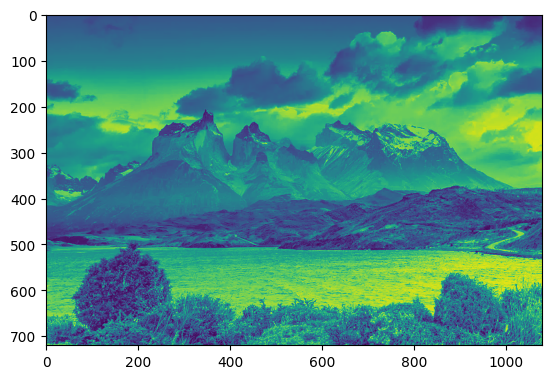

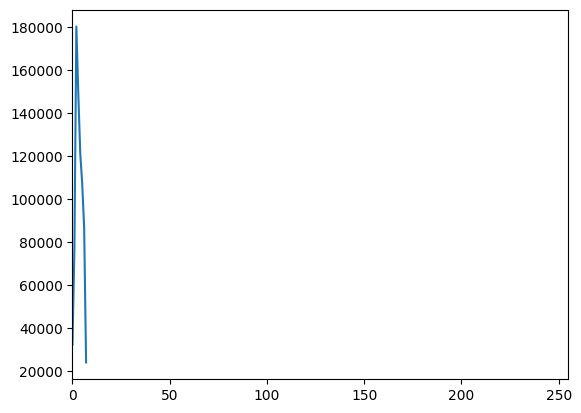

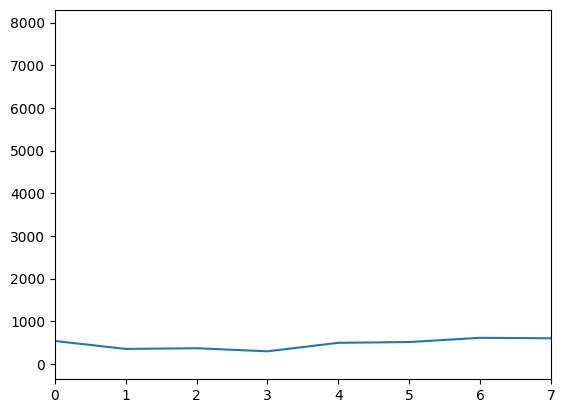

In [213]:
#grayscale image's histogram
#transfer to grayscale
img = cv2.imread('mountain.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#define bins number and range
num_bins=8
bin_range = [0, 256]

#create two histograms to compare
hist1 = cv2.calcHist([gray_img], [0], None, [num_bins], bin_range)
hist2 = cv2.calcHist([gray_img], [0], None, [256], bin_range)

#plot
plt.imshow(gray_img)
plt.show()

plt.plot(hist1)
plt.xlim([0,255])
plt.show()

plt.plot(hist2)
plt.xlim([0, num_bins-1])
plt.show()

### Matplotlib Helper Functions

- plt.plot()
- plt.xlim() and plt.ylim()
- plt.show()
- plt.xlabel() and plt.ylabel()
- plt.title()
- plt.imshow()
- plt.colorbar()
- etc.

### Histogram for colored images

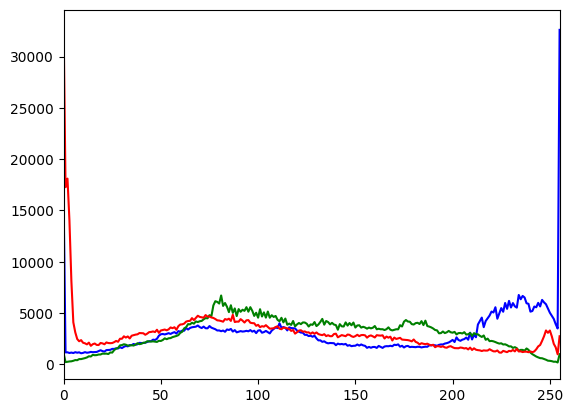

In [214]:
#cv2.calcHist() can process one chanel
#colored image's histogram

#split chanels
b, g, r = cv2.split(img)

#define histsize, hist range
histSize = 256
histRange = (0,256)

#create histogram
b_hist = cv2.calcHist([b], [0], None, [histSize], histRange)
g_hist = cv2.calcHist([g], [0], None, [histSize], histRange)
r_hist = cv2.calcHist([r], [0], None, [histSize], histRange)

#plot
plt.plot(b_hist, color='b')
plt.plot(g_hist, color='g')
plt.plot(r_hist, color='r')
plt.xlim([0,255])
plt.show()

### Two-Dimensional Histogram

- 2D Histogram can analyze the relations between these two channels, which could help us determine the color intensity or spatial relationships between the two channels.

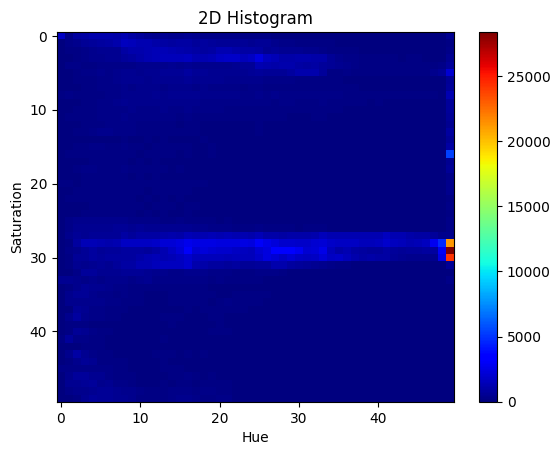

In [215]:
#convert image to hsv image
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

#split channels
h, s, v = cv2.split(hsv_img)

#define bins
bins = [50,50]

#compute 2D histogram
hist = cv2.calcHist([h, s], [0, 1], None, bins, [0,180,0,256])

#plot
plt.imshow(hist, interpolation='nearest', origin='upper', aspect='auto', cmap='jet')
plt.colorbar()
plt.xlabel('Hue')
plt.ylabel('Saturation')
plt.title('2D Histogram')
plt.show()

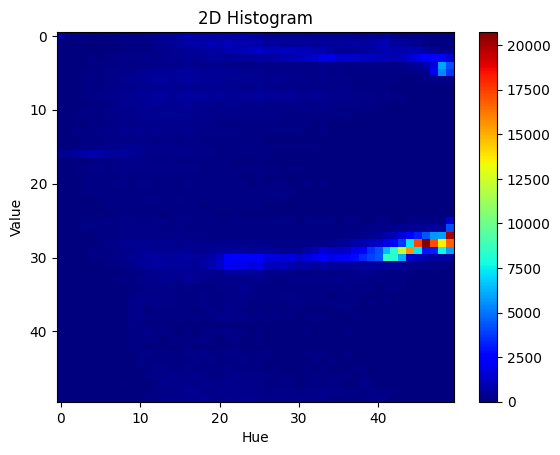

In [216]:
#compute another 2D histogram
hist = cv2.calcHist([h, v], [0, 1], None, bins, [0,180,0,256])

#plot
plt.imshow(hist, interpolation='nearest', origin='upper', aspect='auto', cmap='jet')
plt.colorbar()
plt.xlabel('Hue')
plt.ylabel('Value')
plt.title('2D Histogram')
plt.show()

### Histogram with masks

- Masks allow us to select and work on exactly what we want to study in an image, which can be really useful.

- The advantage of using masks in histograms is that they give us more control and precision in our analysis. Instead of looking at the whole picture, we can zero in on particular areas and get detailed information about just those parts.

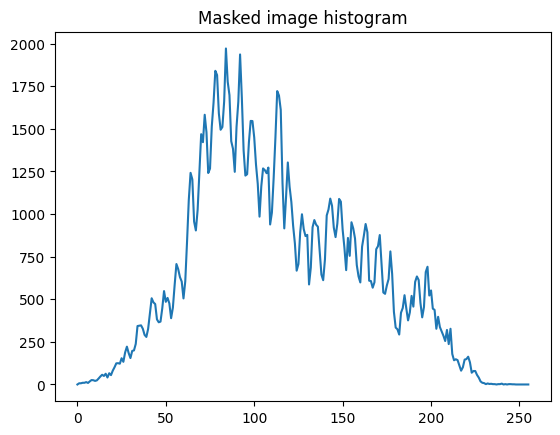

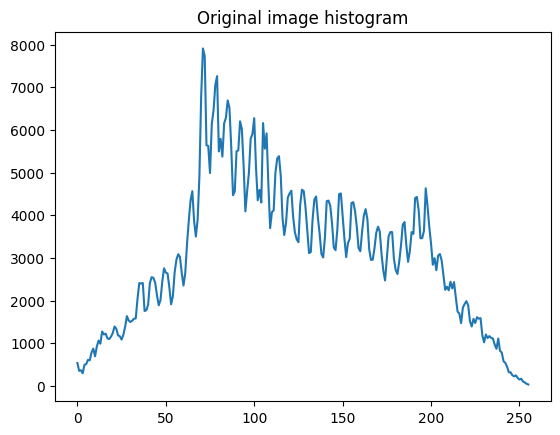

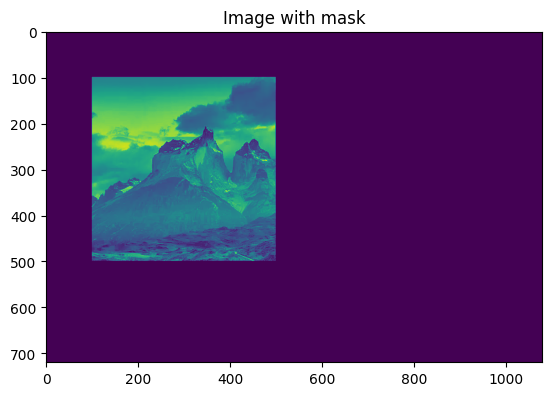

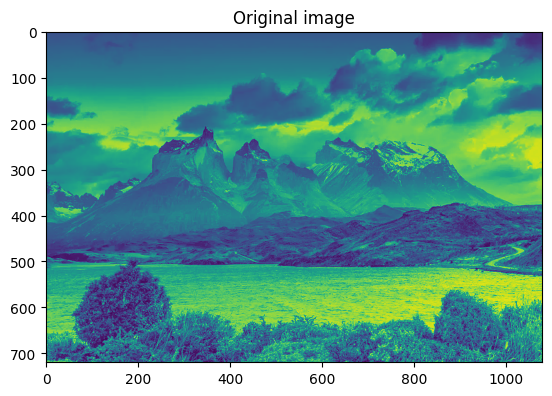

In [235]:
#histogram with masks

#img
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#create a binary mask
mask = np.zeros_like(img, dtype=np.uint8)
mask[100:500,100:500] = 255

#apply the mask
mask_img = cv2.bitwise_and(img, mask)

#compute hist with mask
hist_mask = cv2.calcHist([img], [0], mask_img, [256], [0,256])
#orginal hist
hist_original = cv2.calcHist([img],[0], None, [256], [0,256])

#plot
plt.plot(hist_mask)
plt.title("Masked image histogram")
plt.show()

plt.plot(hist_original)
plt.title("Original image histogram")
plt.show()

plt.imshow(mask_img)
plt.title("Image with mask")
plt.show()

plt.imshow(img)
plt.title("Original image")
plt.show()

### Histogram equalization
#### Intro

<img src="example1.png" width="500" height="400">

- Histogram equalization(均衡化) is the process of improving the contrast of an image. The unevenly distributed intensity values in an image are stretched out, creating a more even intensity distribution over the image. This method effectively improves the global contrast of the image.
  
- Our histogram equalization process has been able to increase the contrast of the image. The brighter areas of the image become whiter, and the darker areas become more pronounced, resulting in a significantly improved image.

- cv2.equalizeHist() 

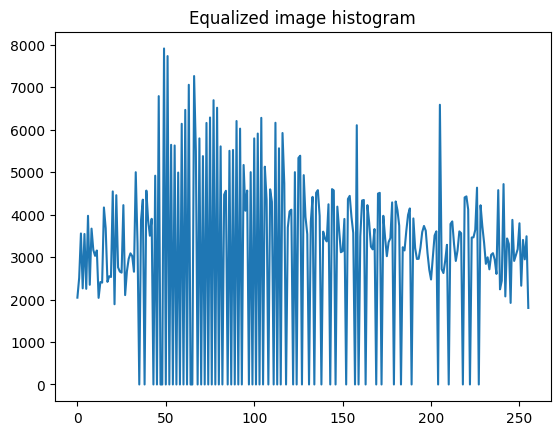

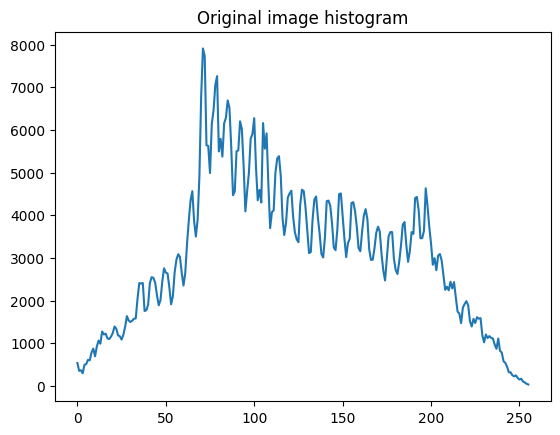

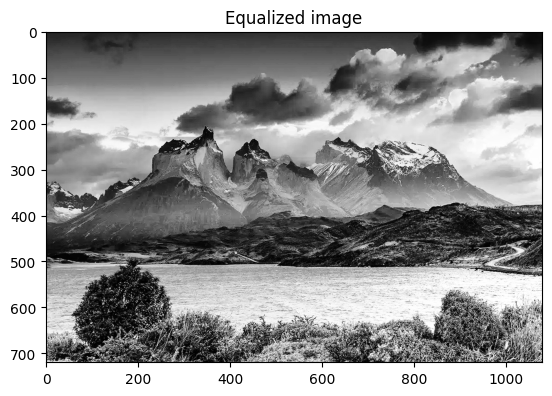

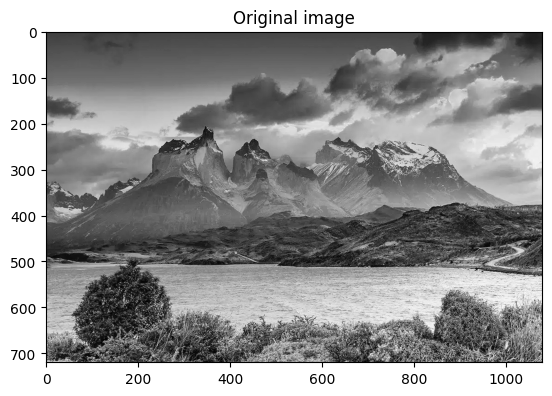

In [238]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#original hist
hist_org = cv2.calcHist([img], [0], None, [256], [0,256])

#equalize
equalized = cv2.equalizeHist(img)

#equalized hist
hist_equa = cv2.calcHist([equalized], [0], None, [256], [0,256])

#plot
plt.plot(hist_equa)
plt.title("Equalized image histogram")
plt.show()

plt.plot(hist_org)
plt.title("Original image histogram")
plt.show()

plt.imshow(equalized, cmap='gray')
plt.title("Equalized image")
plt.show()

plt.imshow(img, cmap='gray')
plt.title("Original image")
plt.show()

#### Equalization on colored image

- equalization is performed on each channel of a multi-channel image and the same function cv2.equalizeHist() can be used to perform histogram equalization.

- However, there are some important considerations to be noted about histogram equalization on colored images.

- While we can perform histogram equalization on RGB or BGR images, it is recommended not to use this color space for histogram equalization. This is because RGB color space does not separate the brightness from the color information in the images, so performing histogram equalization on this channel will produce distorted results.

- It is recommended to perform histogram equalization in color space that separates the brightness from color information. We can use the Value channel in the HSV color space, the Lightness channel in the HSL color space, or the Luminance channel in the Lab Color space for histogram equalization.

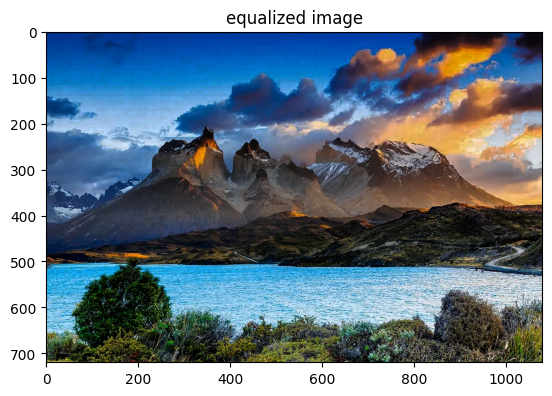

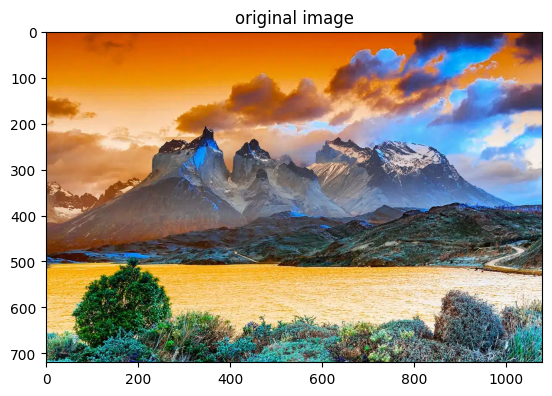

In [244]:
#convert image to hsv
img = cv2.imread('mountain.jpg')
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

#split channels
h, s, v = cv2.split(hsv_img)

#perform equalization on value-channel
v_eq = cv2.equalizeHist(v)

#merge back to hsv image
hsv_img_eq  = cv2.merge((h, s, v_eq))

#convert image back to rgb
img_eq = cv2.cvtColor(hsv_img_eq, cv2.COLOR_HSV2RGB)

#plot
plt.imshow(img_eq)
plt.title("equalized image")
plt.show()

plt.imshow(img)
plt.title("original image")
plt.show()


#### Adaptive histogram equalization (AHE)

- AHE is used to perform equalization while considering local variations in the intensity distributions of the image. Unlike the standard histogram equalization, which applies a global transformation of the image, adaptive equalization applies the same technique independently to small local regions of the image. Adaptive histogram equalization techniques thus help us in improving contrast in images with local variations in intensity.


- <img src="example2.png" width="500" height="400">

#### Contrast limited adaptive histogram equalization (CLAHE)

- is an extension of the adaptive histogram equalization technique. As discussed previously, AHE often results in undesirable results, especially in low-contrast regions. One of the major issues in the vanilla AHE model was that there was a major contrast difference in nearby grid sub-regions of the image. CLAHE helps to circumvent some of these issues and handles histogram equalization in a much better way.
  
- The main advantage CLAHE offers is that it limits the contrast. It does so by introducing a contrast limit parameter that controls the region-wise amount of contrast enhancement in the image. By applying limits on contrast, CLAHE prevents the excess amplification of noise in the image.
CLAHE works by dividing the image into small sub-regions and then computing the histogram for each region. The histogram values are clipped based on the predefined contrast limit parameter. The cumulative distribution function (CDF) for the clipped histogram is calculated, and it is then used to map the pixel intensities in each tile for achieving contrast enhancement. The sub-regions are then combined to create the enhanced output image.

- cv2.createCLAHE(clipLimit=40, tileGridSize=(8,8))

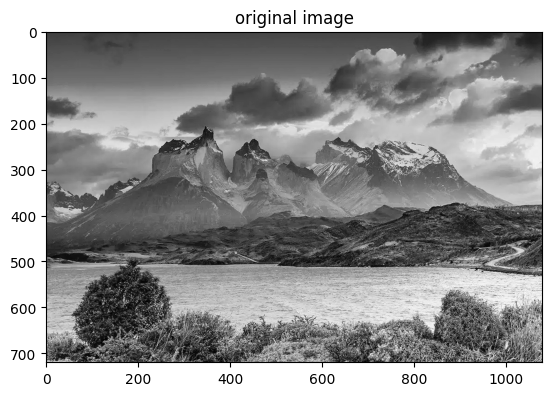

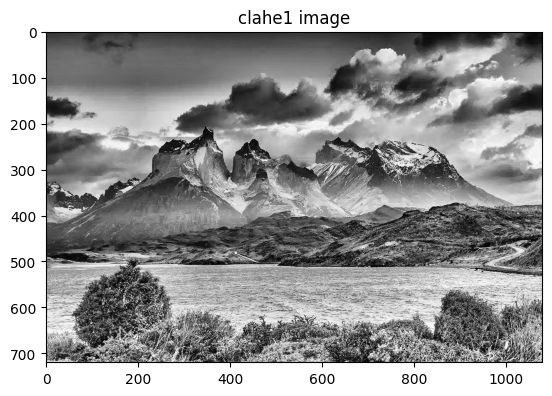

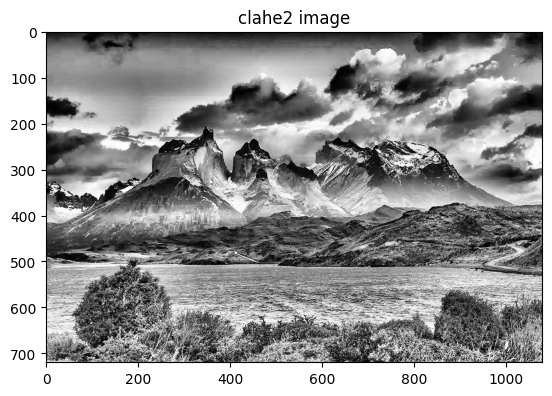

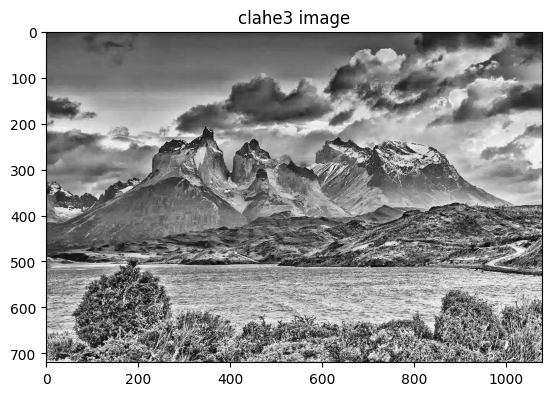

In [246]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#create CLAHE object
clahe1 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe2 = cv2.createCLAHE(clipLimit=20.0, tileGridSize=(8,8))
clahe3 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(24,24))

#Apply CLAHE object to img
c1_img = clahe1.apply(img)
c2_img = clahe2.apply(img)
c3_img = clahe3.apply(img)

#plot
plt.imshow(img, cmap='gray')
plt.title("original image")
plt.show()
plt.imshow(c1_img, cmap='gray')
plt.title("clahe1 image")
plt.show()
plt.imshow(c2_img, cmap='gray')
plt.title("clahe2 image")
plt.show()
plt.imshow(c3_img, cmap='gray')
plt.title("clahe3 image")
plt.show()

### Histogram for Feature Extraction

- Histograms provide insights into the intensity distribution of an image and the frequency of the various characteristics and attributes of an image. This makes histograms an effective tool for feature extraction in images. We can use histograms to capture the color and texture of images and use this information for various purposes, such as image segmentation or image retrieval.

- Histogram of Oriented Gradients (HOG) features capture the distribution of gradient orientations in an image and are used for various tasks such as face detection, human activity recognition, and gesture recognition. We will discuss HOG in detail as we move along with the chapter.

- Features extracted using histograms can be used for various applications, such as content-based image retrieval, handwritten digit recognition and many other computer vision use cases, making them a very effective and widely used feature of image processing applications.

## Chap6. Image Segmentation

- Introduction to image segmentation
- Basic segmentation techniques
    - Thresholding
        - Simple thresholding
        - Adaptive thresholding
        - Otsu’s thresholding
    - Edge and Contour based segmentation

- Advanced segmentation techniques
    - Watershed algorithm
    - GrabCut algorithm
    - Clustering based segmentation


- Deep Learning-based segmentation techniques (details in Chap10)


#### Intro

- <u>Pixel-based segmentation</u> operates at the pixel level and assigns categories to individual pixels in an image. Some of the pixel-based segmentation techniques include <u>thresholding, clustering, or edge detection</u>. Region-based segmentation divides the image into regions based on similarities such as color or texture. Region-based segmentation techniques include region growing and watershed segmentation.
  
- <u>Semantic segmentation</u> is the process of assigning a label to every pixel in an image. The various objects in the image are divided into categories and labelled accordingly, with each class having a different color. For reference, in the preceding autonomous driving car example, all the vehicles on the road will be categorized together and labeled with the same color. Similarly, all the remaining pixels will be labeled into different categories such as roads, traffic lights or pedestrians, with each class having a separate color.

- <u>Instance segmentation</u> helps us to differentiate each object in the image separately irrespective of the class it belongs to. All the objects in instance segmentation are distinguished separately and are not divided into the same class as we do in semantic segmentation. In the autonomous car example, all the vehicles in the image will be divided into individual objects and not as a single class enabling the identification of individual objects. Similarly, all the occurrences of objects of pedestrians, traffic lights and roads will be segmented separately.

- <u>Panoptic segmentation</u> is a combination of semantic and instance segmentation. Pixels are assigned a class and each object in the class is also segmented separately, allowing us to both distinguish and identify individual instances within the scene.

### Basic techniques
#### Simple thresholding


Simple thresholding can be performed using various techniques:

- Binary Thresholding: This is the simple binary segmentation where the image pixels are segmented into two categories based on the threshold values. Pixel intensity values above this value are set to the maximum value, and values below or equal are set to 0.
  
- Inverse Binary Thresholding: This is exactly the opposite of binary thresholding. It is the flipped result of the binary thresholding. Pixel intensities above the threshold value are set to 0 while the pixel intensities below or equal are set to the maximum value.

- Truncated Thresholding: In this method, all the pixel intensities above the threshold value are set to the threshold value instead of the maximum value. The pixel intensities remain unchanged if they are below or equal to the threshold value.

- Threshold to Zero: This method converts the pixel intensities below the threshold value to zero. Pixel intensities above the threshold value remain unchanged.

- Inverse Threshold to Zero: Opposite of the Threshold to Zero parameter. Pixel intensity values above the threshold value are set to 0. Values below or equal to the threshold value remain unchanged.

- cv2.threshold(src, thresh, maxval=255, type=’cv2.THRESH_BINARY’, dst])

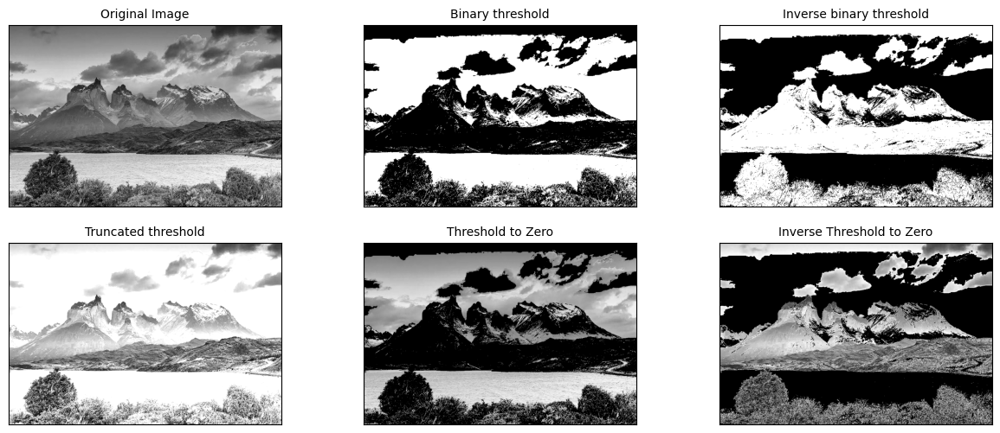

In [251]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

#Apply binary threshold
_, binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

#Apply inverse binary threshold
_, inv_binary =  cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)

#Apply truncated threshold
_, trun =  cv2.threshold(img, 127, 255, cv2.THRESH_TRUNC)

#Apply zero threshold
_, to_zero =  cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO)

#Apply inverse zero threshold
_, inv_to_zero =  cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO_INV)


#plot
plt.figure(figsize=(15, 6))
plt.subplot(231), plt.imshow(img, cmap='gray')
plt.title('Original Image', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(232), plt.imshow(binary, cmap='gray')
plt.title('Binary threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(233), plt.imshow(inv_binary, cmap='gray')
plt.title('Inverse binary threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(trun, cmap='gray')
plt.title('Truncated threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(235), plt.imshow(to_zero, cmap='gray')
plt.title('Threshold to Zero', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(236), plt.imshow(inv_to_zero, cmap='gray')
plt.title('Inverse Threshold to Zero', fontsize=10), plt.xticks([]), plt.yticks([])

plt.show()

#### Adaptive thresholding

- Adaptive thresholding involves dividing the image into small regions and applying a different threshold value for each sub-region of the image. Unlike simple thresholding, we do not need to provide the thresholding value manually while using adaptive thresholding. Adaptive thresholding uses statistical methods, mean and Gaussian to calculate the thresholding value for the image.

- Adaptive thresholding is particularly helpful when the lighting conditions on the image are not uniform and the image has a lot of intensity variations. This allows for a more accurate segmentation of the image and optimal results can be achieved by using other parameters in the adaptive thresholding function in the OpenCV library.

- Function: cv2.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize, C)
    
    - adaptiveMethod: The method used to calculate the threshold value. 
        - cv2.ADAPTIVE_THRESH_MEAN_C: Mean Adaptive Thresholding
        - cv2.ADAPTIVE_THRESH_GAUSSIAN_C: Gaussian Adaptive Thresholding
    
    - thresholdType: The type of thresholded result we want:

        - cv2.THRESH_BINARY: Binary Image
        - cv2.THRESH_BINARY_INV: Inverted Binary Image
        - 
    - blockSize: The size of the neighborhood to be considered for calculating the threshold value. This should be an odd number and the default value for this parameter is 3.
    - C: A constant value that is subtracted from the mean or Gaussian average. The default value for this parameter is 0 indicating that no value will be subtracted.

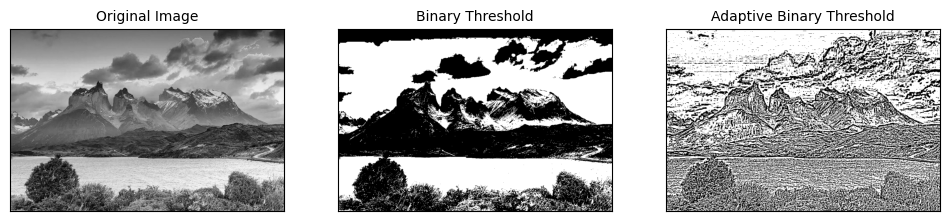

In [256]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

#Apply binary threshold
_, thre_simple = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

#Apply Adaptive threshold
thre_adv = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                 cv2.THRESH_BINARY, 11,2)

#plot
plt.figure(figsize=(12,4))
plt.subplot(131), plt.imshow(img, cmap='gray')
plt.title('Original Image', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(thre_simple, cmap='gray')
plt.title('Binary Threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(thre_adv, cmap='gray')
plt.title('Adaptive Binary Threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.show()

#### Otsu’s thresholding

- Otsu’s thresholding is used to automatically calculate the threshold value for image segmentation and eliminates the need to manually search for an effective threshold value. Otsu’s thresholding calculates the best possible threshold value for the image by using the histogram of the grayscale image.

- Otsu’s thresholding works best on images where there are two clearly defined peaks in the histogram of the image and finds the best possible threshold value to separate these peaks. The method works by maximizing the inter-class variance between the foreground and background regions of the image. Otsu’s method iterates over all the possible threshold values and chooses the value with the maximum variance in the image. Once the threshold value is calculated, binary thresholding can be applied to the image using this threshold value.

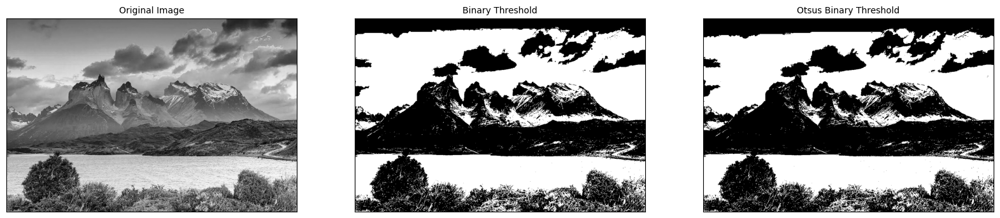

In [267]:
img = cv2.imread('mountain.jpg')
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

#Apply binary threshold
_, thre_simple = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

#Apply Otsu's threshold
retval, thre_Otsu = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU+cv2.THRESH_BINARY)

#plot
plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(img, cmap='gray')
plt.title('Original Image', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(thre_simple, cmap='gray')
plt.title('Binary Threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(thre_Otsu, cmap='gray')
plt.title('Otsus Binary Threshold', fontsize=10), plt.xticks([]), plt.yticks([])

plt.show()

### Edge and Contour based segmentation

- Edge-based techniques work by first applying an edge detection algorithm to map out the boundaries in an image. Edge detection algorithms, such as the Canny edge detector or Sobel operator, are applied to highlight these transitions and generate a binary edge map. Once an edge is detected a binary map is created the edge pixels are assigned a value of 1, representing the presence of an edge, while the non-edge pixels are assigned a value of 0. This binary edge map serves as a mask that outlines the boundaries of objects or regions in the image.

- Contour-based segmentation is a technique used to identify and extract boundaries or contours of objects or regions in an image. We start contour-based segmentation with edge detection, where edges are detected using algorithms like Canny or Sobel. These edge pixels are then connected to form continuous curves or contours. Once the contours are detected, we can use them for further processing. Common operations in contour-based segmentation include filtering contours based on area, perimeter, or aspect ratio, approximating contours to simplify shape, and analyzing contour hierarchy.

- Contour-based segmentation is particularly useful when dealing with objects or regions that have distinct boundaries and well-defined shapes. In practical implementations, contour-based segmentation is often combined with other techniques, such as thresholding or region growing, to achieve more accurate and robust segmentation results.

- More in Chap7.

### Advanced segmentation techniques
#### Watershed algorithm

- “分水岭”
- for grayscale image
- The algorithm uses gradient or intensity information to detect boundaries and regions in the image.
- The Watershed algorithm is particularly useful when extracting objects that are very close or touching each other.
- It is a widely applied technique with diverse applications in fields such as medical image analysis or object recognition.
- 一般步骤：
    1. 预处理：对原始图像进行预处理，可能包括滤波、去噪等，以去除噪声并突出感兴趣的区域。
    2. 转换为灰度图：将图像转换为灰度图像，因为 watershed 算法是基于灰度级别的。
    3. 二值化：使用适当的阈值方法对灰度图像进行二值化处理，以便分离前景（感兴趣的物体）和背景。
    4. 寻找确定的前景区域：这通常涉及到找到所有你想分割的物体。可以使用形态学操作，如膨胀、腐蚀等来实现。
    5. 确定背景区域：这通常是通过对二值图像进行形态学膨胀操作，以确定不是物体的区域。
    6. **使用 cv2.distanceTransform()**：这个函数计算一个图像中每个非零像素点到最近零像素点的距离。在 watershed 算法中，distanceTransform() 用于找到前景物体的中心区域。因为在物体的中心，距离背景的距离最远，所以这个变换的结果可以用来确定种子点，即物体中心的确切区域。（距离参数：cv2.DIST_L1; cv2.DIST_L2; cv2.DIST_C）
    7. 确定未知区域：这是前景和背景确定后剩余的区域。
    8. 标记标签：使用 cv2.connectedComponents() 来标记前景区域。每个独立物体分配一个标签。
    9. 应用 watershed 算法：最后，调用 cv2.watershed() 函数，它会修改标记图像的边界区域（标记为0的区域）以分割物体。算法的结果是边界标记为-1的图像，表示物体的轮廓。

<img src="example3.png" width="800" height="600">

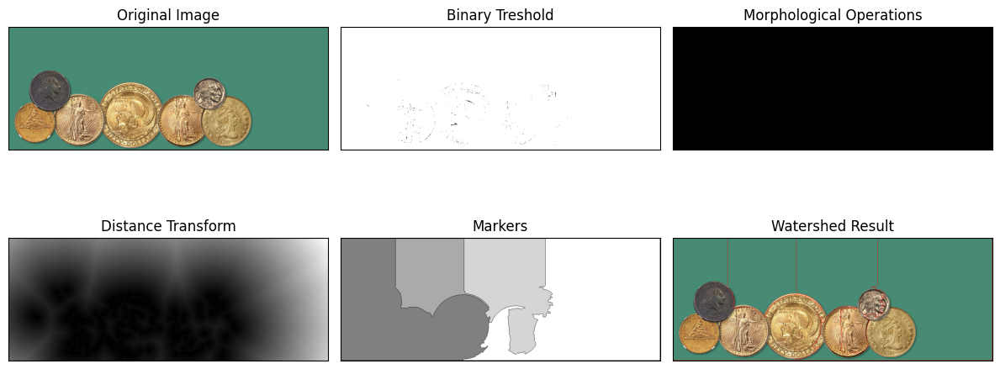

In [291]:
#example
#image convert to gray
img = cv2.imread("coins.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
original = img.copy() #for compare only

#Apply binary(inverse) threshold
r, binary = cv2.threshold(gray, 245, 255, cv2.THRESH_BINARY_INV)

#Morphological operation - opening (remove noise + enhance ROI)
kernel = np.ones((3,3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
#then dilate opening and get the background
sure_bg = cv2.dilate(opening, kernel, iterations=2) 

#Perform distance transformation to identify markers
#use L2 distance here
#by thresholding to get the foreground
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
r, sure_fg = cv2.threshold(dist_transform, 0.5*dist_transform.max(), 255, 0) 

#Identify unknown area (difference between background and foreground)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

#create markers to watershed algorithm
r, markers = cv2.connectedComponents(sure_fg)

#By adding 1 to all labels, we ensure that the background region is labeled as 0
#foreground regions are labeled with positive values. 
#These marker regions represent different objects or regions of interest that we aim to segment.
markers += 1
markers[unknown==255]=0

#Apply Watershed
cv2.watershed(img, markers)
img[markers==-1]=[0,0,255]

#Convert to RGB to display
gray_rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

#plot iterations
titles = ["Original Image","Binary Treshold","Morphological Operations",
          "Distance Transform", "Markers", "Watershed Result"]

images = [original_rgb, binary, sure_bg, dist_transform, markers, img_rgb]

plt.figure(figsize=(12,6))
for i in range(len(titles)):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()

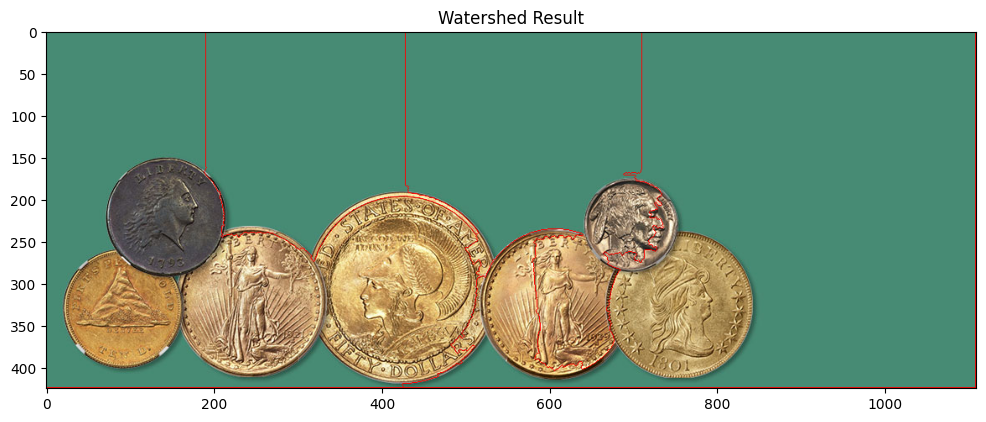

In [290]:
plt.figure(figsize=(12,10))
plt.imshow(img_rgb)
plt.title("Watershed Result")
plt.show()

#### GradCut algorithm

- The GrabCut algorithm begins by defining a rough outline around the target object. It then utilizes the color information inside and outside the outline to distinguish between the object and the background. Through iterative refinement using color and texture cues, the algorithm progressively improves the segmentation until a satisfactory result is achieved.

- The algorithm is based on graph cuts and uses complex non-image processing operations such as Gaussian Mixture Models and graph cuts. Understanding the concepts behind GrabCut requires in-depth knowledge that goes beyond the scope of this course, making it less beneficial to study extensively.

- cv2.grabCut(img, mask, rect, bgdModel, fgdModel, iterCount=5, mode=’cv2.GC_INIT_WITH_RECT’)

1. 加载图像：首先，加载你要分割的图像。
2. 初始化掩码：创建一个与图像同样大小的掩码，用于标记前景、背景以及可能是前景或背景的区域。
- OpenCV定义了4种可能的标记：
   - cv2.GC_BGD：标记明确为背景的像素（值为0）。
   - cv2.GC_FGD：标记明确为前景的像素（值为1）。
   - cv2.GC_PR_BGD：标记可能为背景的像素（值为2）。
   - cv2.GC_PR_FGD：标记可能为前景的像素（值为3）。
     
3. 定义前景和背景模型：定义两个数组，用于算法内部存储和计算前景和背景的颜色分布模型。
4. 设置矩形ROI（如果需要）：如果已知前景对象大致在图像中的位置，可以定义一个矩形（ROI），该矩形内部的像素初步假设为前景，外部的像素假设为背景。这个步骤不是必需的，但可以帮助算法更快地收敛。
5. 应用GrabCut：使用 cv2.grabCut() 函数应用算法。这个函数需要原始图像、初始化的掩码、ROI矩形（可选）以及前景和背景模型。该函数还需要迭代次数，即算法执行的次数。
6. 提取前景：算法完成后，掩码中的像素会被更新以反映它们属于前景还是背景。使用掩码提取前景，通常通过将掩码中的前景和可能的前景像素设置为1，其他设置为0，然后将掩码与原始图像相乘。

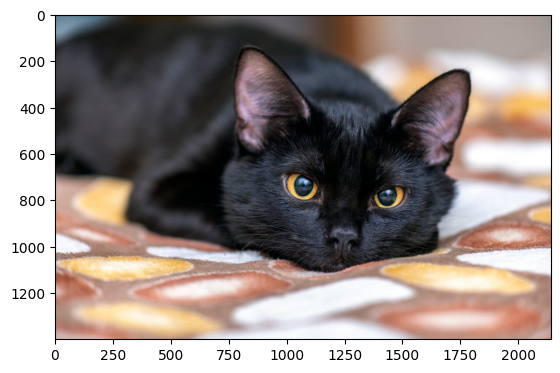

In [302]:
img = cv2.imread("Blackcat.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

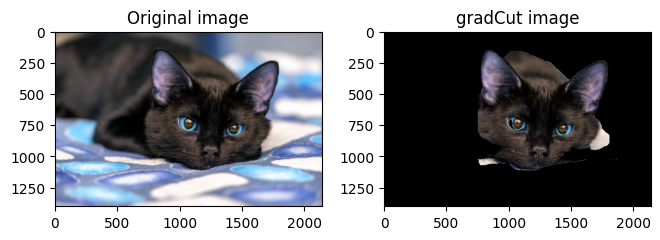

In [297]:
#gradCut example

#create a mask
mask = np.zeros(img.shape[:2], np.uint8)

#create background and foreground model
bgdModel = np.zeros((1,65), np.float64)
fgdModel = np.zeros((1,65), np.float64)

#define ROI rectangle (optional)
rect = (750,150,1700,1050)

#apply gradCut
cv2.grabCut(img, mask, rect, bgdModel, fgdModel,
            iterCount=5, mode=cv2.GC_INIT_WITH_RECT)

#assign 0 and 2 to the background and possible background regions in the mask
#mask value with possibly change to 0 or 2 (possible background) during gradCut iterations
#thus, need mask2 to turn all possible background to 0, then leave the object as 1
mask2 = np.where((mask==0)|(mask==2), 0, 1).astype('uint8')

#apply new mask to original mask to extract the foreground
result = img * mask2[:, :, np.newaxis]

#convert img to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

#display
plt.figure(figsize=(10,8))
plt.subplot(131), plt.imshow(img, cmap='gray')
plt.title("Original image")

plt.subplot(132), plt.imshow(result, cmap='gray')
plt.title("gradCut image")

plt.tight_layout()
plt.show()

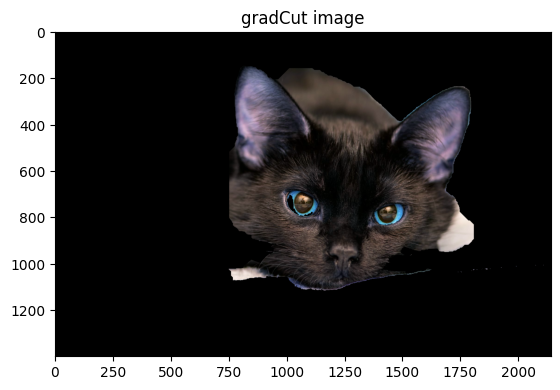

In [301]:
plt.imshow(result)
plt.title("gradCut image")
plt.show()

#### Clustering based segmentation

- In clustering-based algorithms, the pixels are treated as data points in a high-dimensional feature space. The algorithm uses distance or similarity metrics such as Euclidean distance and concise similarity to compare pixels and analyze the similarity between them to group them into various clusters.

- Clustering-based segmentation can be effective in scenarios where the image contains objects or regions with distinct visual properties, such as different colors or textures. However, it may struggle with complex scenes or regions that exhibit significant variations within the same object class.

- Various clustering-based algorithms can be used for segmentation, such as <u>KMeans clustering(see Chap8.)</u>, mean shift clustering or model-based clustering. KMeans clustering is one of the most popular and efficient clustering algorithms in use these days. However, KMeans clustering expects us to provide the number of clusters in advance. We will be discussing more about KMeans in detail and implementing some code as we move along to the Machine Learning with Computer Vision chapter of the course.

### Deep Learning Segmentation

- Deep learning segmentation involves training deep neural networks on large, annotated datasets with mappings between input images and their corresponding segmentation masks. These deep neural networks learn to automatically extract relevant features from the input images and make predictions about the class or label of each pixel or region in the image, enabling them to accurately segment objects or regions of interest.

- Deep learning segmentation networks require a large amount of labeled data and a long training time to train and give decent results. However, many widely available pre-trained models can be used for implementing image segmentation using deep learning. Some of the deep learning segmentation networks such as U-Net and RCNN have been able to achieve state-of-the-art performance in terms of segmentation accuracy and precision.

- Deep learning training is a complex and resource-intensive process that typically involves a substantial amount of data and extensive computational resources.
- More in Chap10.